# Thesis Figs

In this file, we create code that generates csvs, which can be used to produce the plots shown in the thesis. The csvs are loaded in R in the thesis_files folder, where the plots are created in .Rmd files

In [1]:
import torch
import numpy as np
import scipy
from datetime import datetime
import matplotlib.pyplot as plt
#import mcbo
from mcbo import task_factory
from mcbo.optimizers.bo_builder import BoBuilder, BO_ALGOS
from mcbo.optimizers.non_bo.random_search import RandomSearch
from mcbo.optimizers.non_bo.local_search import LocalSearch
from mcbo.acq_funcs import acq_factory
import pfns4bo
import pandas as pd
from pfns4mvbo.priors import cocabo_prior

import sys
sys.path.append('/Users/timothyshinners/Library/Python/3.9/lib/python/site-packages')

from pfns4mvbo.pfn_plotting import showPFNPosteriorDistributions, showPFNvsCOCABOPosteriorDistributions, showPFNvsCOCABO
from pfns4mvbo.mvpfn_optimizer import MVPFNOptimizer
from pfns4mvbo.pfn_acq_func import PFNAcqFunc
from pfns4mvbo.evaluation import normal_logits_overlap

def bootstrap_ub(col):
    # returns the lower and upper bounds of the 95% confidence interval
    bootstrap_samples = np.random.choice(col, size=[1000, len(col)], replace=True).mean(axis=1)
    assert bootstrap_samples.shape[0] == 1000
    ub = np.quantile(bootstrap_samples, 0.975)
    return ub

def bootstrap_lb(col):
    # returns the lower and upper bounds of the 95% confidence interval
    bootstrap_samples = np.random.choice(col, size=[1000, len(col)], replace=True).mean(axis=1)
    lb = np.quantile(bootstrap_samples, 0.025)
    return lb

/Users/timothyshinners/Desktop/thesis_github/PFNs4MVBO


In [2]:
%matplotlib notebook
    
%matplotlib inline

In [ ]:
MODEL_FILENAME = 'trained_models/pfn_bodi_17.pth'
PRIOR_NAME = 'BODi'

task_kws = dict(variable_type=['num', 'nominal'],
                    num_dims=[1, 1],
                    lb=-1,
                    ub=2,
                    num_categories=[2, 2])

task = task_factory(task_name="ackley", **task_kws)

search_space = task.get_search_space()

optimizer_kwargs = {
        'pfn_file': MODEL_FILENAME,
        'acq_func': 'pi',
        'acq_func_optim': 'mab',
        #'device': 'cpu',
        'fast':True
    }

mvpfn = MVPFNOptimizer(search_space=search_space,
                       **optimizer_kwargs)

X_pd = search_space.sample(100)
x = search_space.transform(X_pd).to(torch.float32)
y = task(X_pd)
test_x = torch.vstack([torch.linspace(0, 1, 100).repeat(2), torch.zeros(200)]).T.to(torch.float32)
test_x[100:, 1] = 1
#MODEL_FILENAME = 'trained_models/pfn_bodi_6.pth'
#PRIOR_NAME = 'BODi'

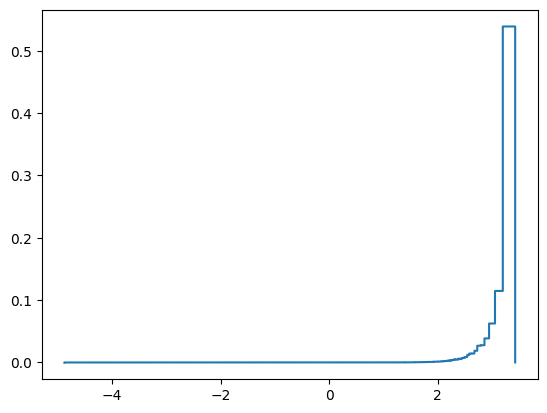

In [13]:
logits = mvpfn.model_pfn.pfn(x, mvpfn.model_pfn.y_to_fit_y(torch.from_numpy(y).to(torch.float32)), test_x.to(torch.float32))

probs = torch.softmax(logits, -1)[8].flatten().detach()
x_axis = mvpfn.model_pfn.pfn.criterion.borders[:-1].flatten()

new_probs = torch.zeros(2*probs.shape[0])
new_probs[::2] = probs
new_probs[1:new_probs.shape[0]-1:2] = probs[1:]

new_x_axis = torch.zeros(2*probs.shape[0])
new_x_axis[::2] = x_axis
new_x_axis[1::2] = x_axis

dat = torch.vstack([new_x_axis, new_probs]).T.numpy()
dat = pd.DataFrame(dat)
# dat.to_csv('data_for_thesis_figures/pfn_output_example.csv')



#plt.plot(mvpfn.model_pfn.pfn.criterion.borders[:-1].flatten(), torch.softmax(logits, -1)[8].flatten().detach())
plt.plot(new_x_axis, new_probs)

0.5906634666411273 2.523309296783311e-19
              X  PFN_1      Normal_1  overlap_1  PFN_2  Normal_2     overlap_2
0     -4.980469    0.0  2.693445e-73   0.590663    0.0  0.000000  2.523309e-19
1     -4.979243    0.0  2.823162e-73   0.590663    0.0  0.000000  2.523309e-19
2     -4.978018    0.0  2.959108e-73   0.590663    0.0  0.000000  2.523309e-19
3     -4.976793    0.0  3.101579e-73   0.590663    0.0  0.000000  2.523309e-19
4     -4.975568    0.0  3.250888e-73   0.590663    0.0  0.000000  2.523309e-19
...         ...    ...           ...        ...    ...       ...           ...
11277  8.837154    0.0  5.962165e-26   0.590663    0.0  0.000191  2.523309e-19
11278  8.838380    0.0  5.799227e-26   0.590663    0.0  0.000187  2.523309e-19
11279  8.839605    0.0  5.640704e-26   0.590663    0.0  0.000183  2.523309e-19
11280  8.840830    0.0  5.486477e-26   0.590663    0.0  0.000180  2.523309e-19
11281  8.842056    0.0  5.336433e-26   0.590663    0.0  0.000176  2.523309e-19

[11282 row

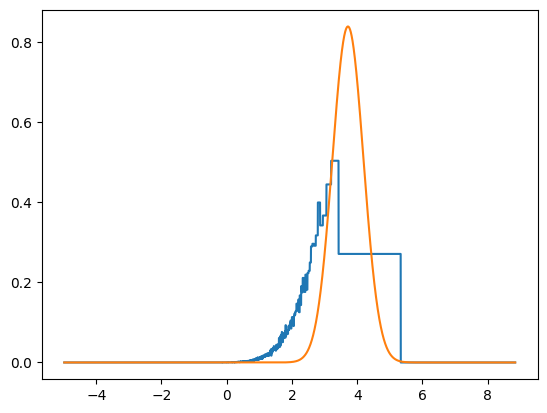

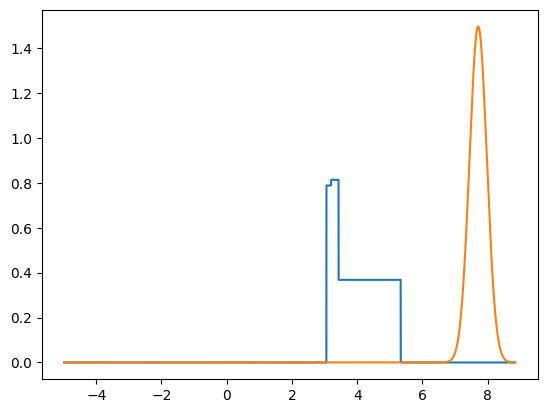

In [15]:
logits = mvpfn.model_pfn.pfn(x, mvpfn.model_pfn.y_to_fit_y(torch.from_numpy(y).to(torch.float32)), test_x.to(torch.float32))
cocabo = BO_ALGOS[PRIOR_NAME].build_bo(search_space=search_space, n_init=1, device=torch.device("cpu"))
_ = cocabo.model.fit(x, torch.from_numpy(y))
mean, variance = cocabo.model.predict(test_x)


probs = torch.softmax(logits, -1).to(device='cpu')
bucket_borders_pfn = mvpfn.model_pfn.fit_y_to_y(mvpfn.model_pfn.pfn.criterion.borders).to(device='cpu')
bucket_widths_pfn = bucket_borders_pfn[1:] - bucket_borders_pfn[:-1]

# define the new precise buckets, using an upper and lower bound
# make sure we get at least 2 samples per bar in the riemann distribution
std = torch.sqrt(variance)
ub = torch.max((mean + 4 * std).max(), bucket_borders_pfn.max() + 0.1).item()
lb = torch.min((mean - 4 * std).min(), bucket_borders_pfn.min() - 0.1).item()
density = torch.max(torch.tensor(10000), (2 * (ub - lb) / bucket_widths_pfn).max()).item()
small_buckets = np.linspace(lb, ub, int(density))
small_bucket_width = small_buckets[1] - small_buckets[0]

# reformat the probs and get pfn_pdf
probs = torch.hstack([torch.zeros([probs.shape[0], 1]), probs, torch.zeros([probs.shape[0], 1])])
pfn_indices = np.digitize(small_buckets, bucket_borders_pfn.detach())
pfn_pdf = probs[:, pfn_indices].detach().numpy()
pfn_pdf = pfn_pdf / np.hstack([1, bucket_widths_pfn.numpy(), 1])[pfn_indices]

# calculate normal_pdf for each bucket
normal_pdf = scipy.stats.norm.pdf(small_buckets, loc=mean.detach().cpu(), scale=np.sqrt(variance.detach().cpu()))

# calculate the overlap as integrate min(pfn_pdf, normal_pdf)
overlap = (pfn_pdf <= normal_pdf) * pfn_pdf + (pfn_pdf > normal_pdf) * normal_pdf
overlap = (overlap * small_bucket_width).sum(axis=1)
print(overlap.max(), overlap.min())

index = overlap.argmax()
dat = {'X':small_buckets, 'PFN_1':pfn_pdf[index], 'Normal_1': normal_pdf[index]}
dat = pd.DataFrame(dat)
dat['overlap_1'] = overlap.max()

index = overlap.argmin()
dat['PFN_2'] = pfn_pdf[index]
dat['Normal_2'] = normal_pdf[index]
dat['overlap_2'] = overlap.min()
print(dat)

# dat.to_csv('data_for_thesis_figures/overlap_example_01.csv')



plt.plot(dat['X'], dat['PFN_1'])
plt.plot(dat['X'], dat['Normal_1'])
plt.show()
plt.plot(dat['X'], dat['PFN_2'])
plt.plot(dat['X'], dat['Normal_2'])
plt.show()

# Example Gaussian Process Fit

used in chapter 2

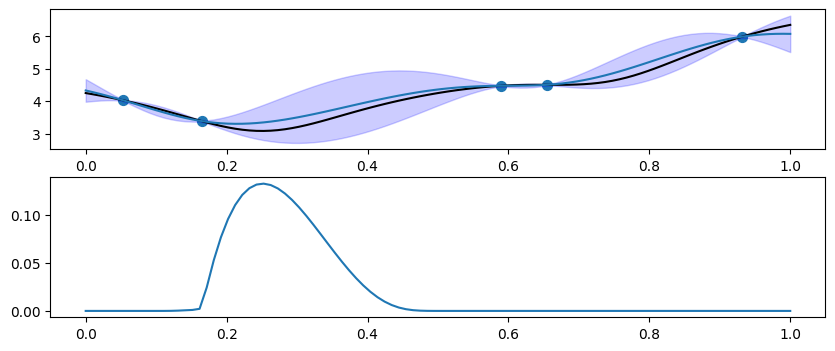

In [93]:
# initialize task and search space
task_kws = dict(variable_type=['num'],
                    num_dims=[2],
                    lb=-0.5,
                    ub=1.5,
                    num_categories=[2])
task = task_factory(task_name="ackley", **task_kws)
search_space = task.get_search_space()
np.random.seed(222222)

# get and format data set
X_pd = search_space.sample(5)
x = search_space.transform(X_pd).to(torch.float32)
x[:,1] = 0
y = task(search_space.inverse_transform(x))
test_x = torch.zeros([100, 2])
test_x[:,0] = torch.linspace(0, 1, 100)

fig, ax = plt.subplots(2, 1, figsize=(10, 4))

# plot the training data
ax[0].scatter(x[:,0],y, s=50)

# Plot the ground truth
ground_truth = task(search_space.inverse_transform(test_x))
ax[0].plot(test_x[:100,0].detach(), ground_truth, c='black')

# calculate mean and CI for posterior distribution
cocabo = BO_ALGOS['CoCaBO'].build_bo(search_space=search_space, n_init=1, device=torch.device("cpu"))
_ = cocabo.model.fit(x, torch.from_numpy(y))
cocabo.model.likelihood.noise = 0.0001
mean_cocabo, variance_cocabo = cocabo.model.predict(test_x)
lower_cocabo = (mean_cocabo - 1.96 * torch.sqrt(variance_cocabo)).detach().flatten()
upper_cocabo = (mean_cocabo + 1.96 * torch.sqrt(variance_cocabo)).detach().flatten()

ax[0].plot(test_x[:, 0].detach(), mean_cocabo.detach().flatten())
ax[0].fill_between(test_x[:, 0].detach(),
                   lower_cocabo,
                   upper_cocabo,
                   alpha=0.2,
                   color='blue')

# Now we do acquisition function
acq = cocabo.acq_func(test_x, cocabo.model, **{'best_y':torch.from_numpy(y).min()})
ax[1].plot(test_x[:,0].detach(), -acq.detach())

# formate csv!
dat = {
    'X':test_x[:,0], 
    'GroundTruth':ground_truth.flatten(), 
    'GPMean': mean_cocabo.flatten().detach(),
    'GPUB': upper_cocabo.flatten().detach(),
    'GPLB': lower_cocabo.flatten().detach(),
    'Acq': -acq.flatten().detach()
}

dat = pd.DataFrame(dat)

training_data = pd.DataFrame({'X':x[:,0].flatten().detach(),'Y':y.flatten()})

#dat.to_csv('data_for_thesis_figures/GP_example.csv')
#training_data.to_csv('data_for_thesis_figures/GP_example_training_data.csv')

# Example GP/PFN fit to training data

CoCaBO
here CoCaBO
GP (mat52 and O)


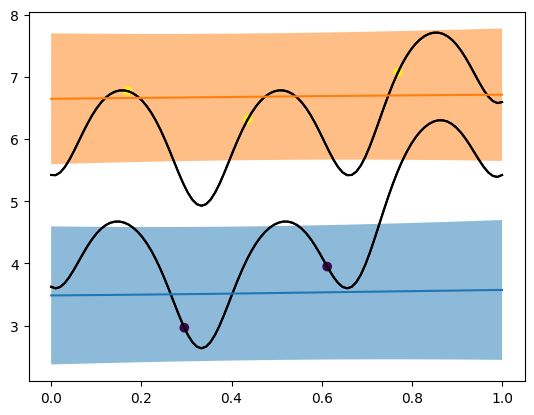

pfn_cocabo_51


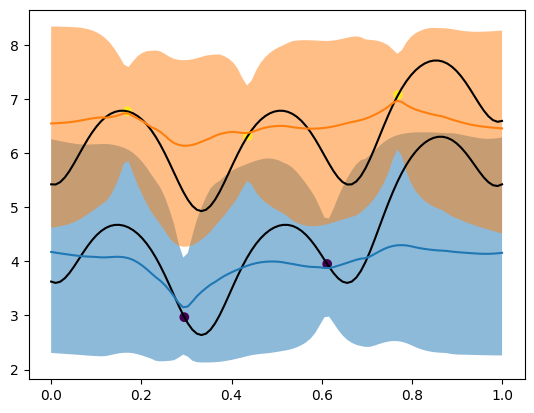

Casmopolitan
here Casmopolitan
GP (mat52 and TO)


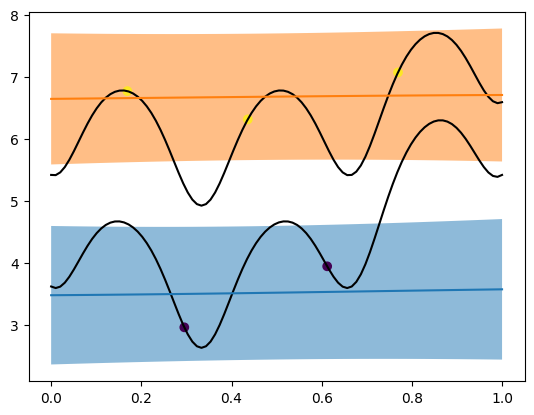

pfn_casmopolitan_16


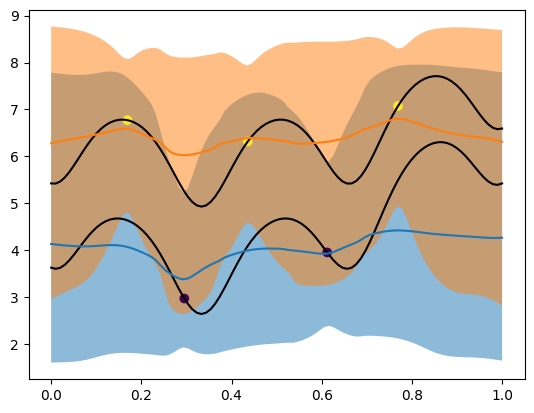

BODi
here BODi
GP (mat52 and HED-mat52)


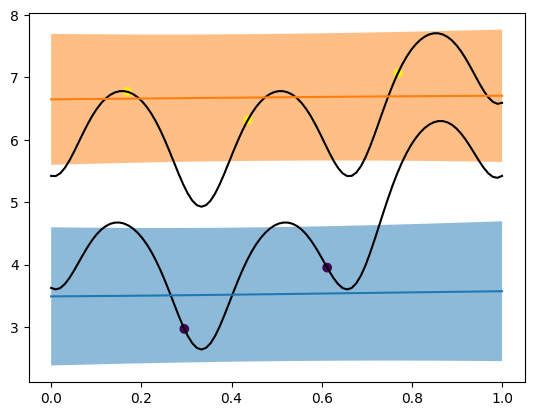

pfn_bodi_24


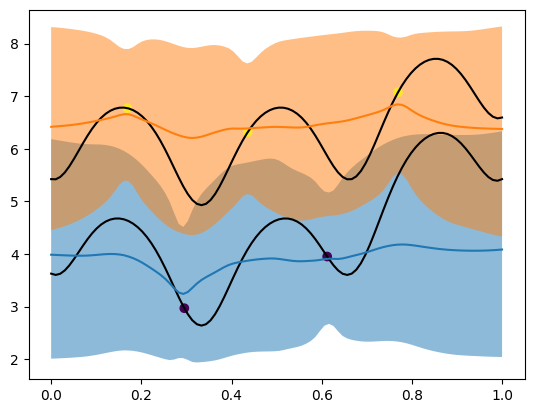

CoCaBO
here CoCaBO
GP (mat52 and O)


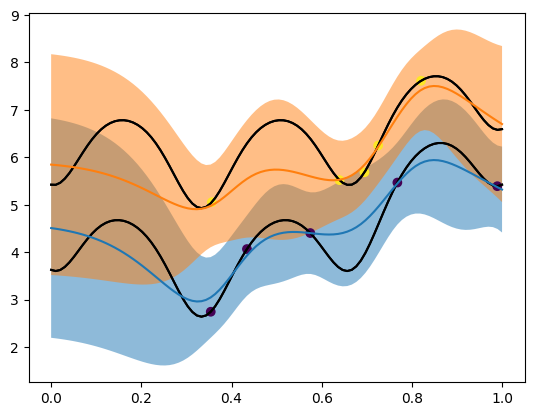

pfn_cocabo_51


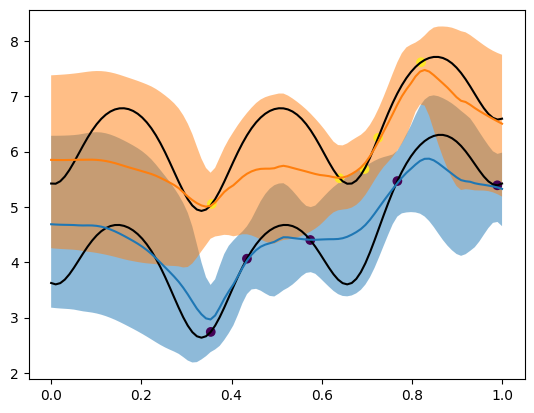

Casmopolitan
here Casmopolitan
GP (mat52 and TO)


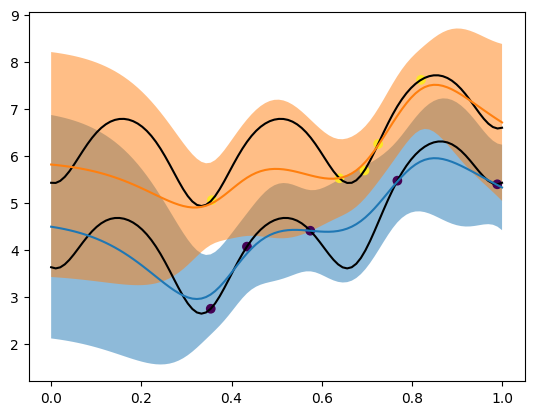

pfn_casmopolitan_16


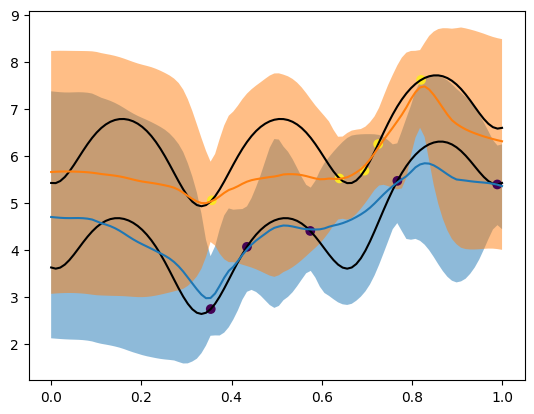

BODi
here BODi
GP (mat52 and HED-mat52)


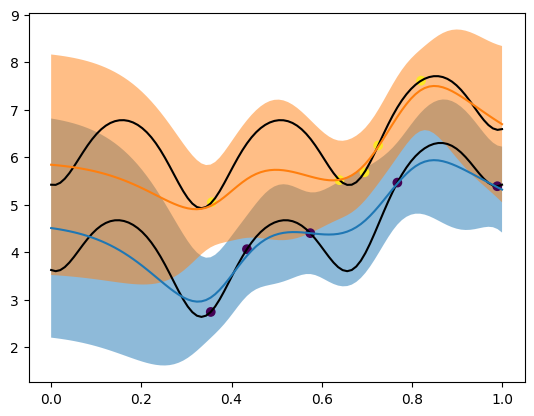

pfn_bodi_24


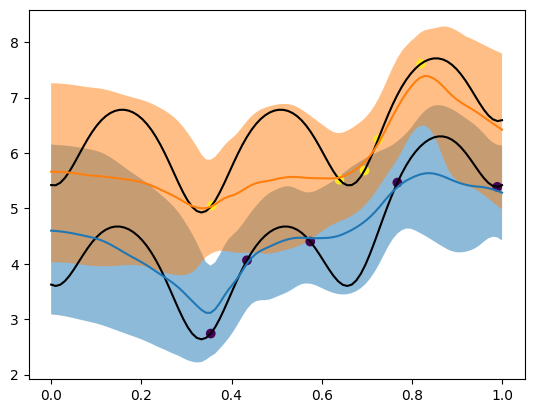

CoCaBO
here CoCaBO
GP (mat52 and O)


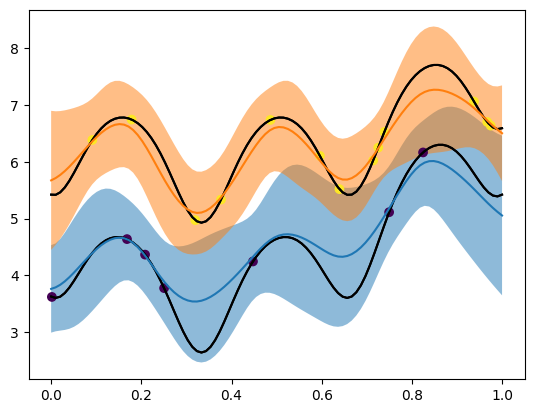

pfn_cocabo_51


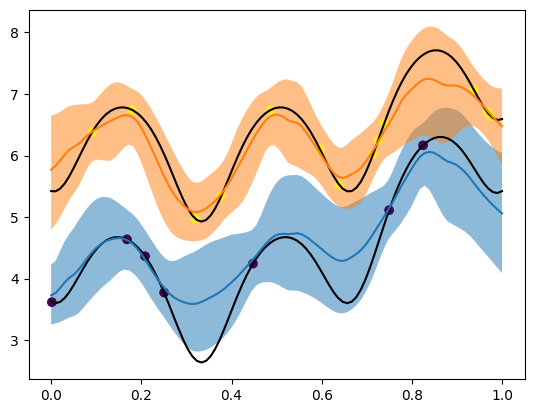

Casmopolitan
here Casmopolitan
GP (mat52 and TO)


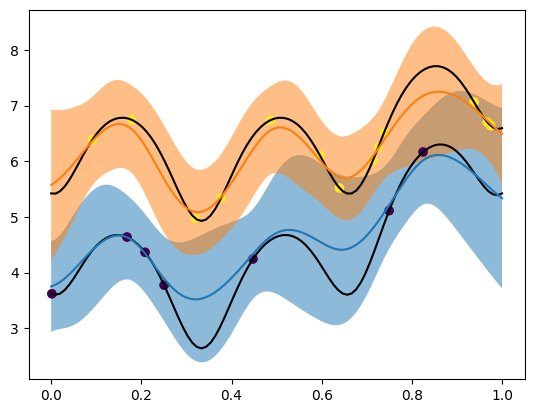

pfn_casmopolitan_16


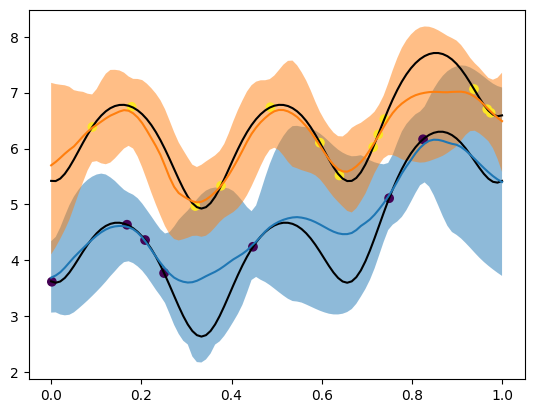

BODi
here BODi
GP (mat52 and HED-mat52)


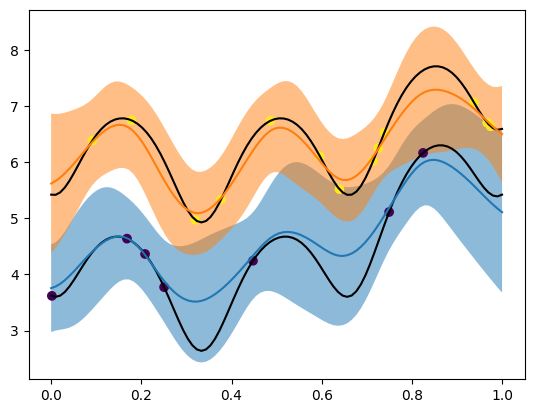

pfn_bodi_24


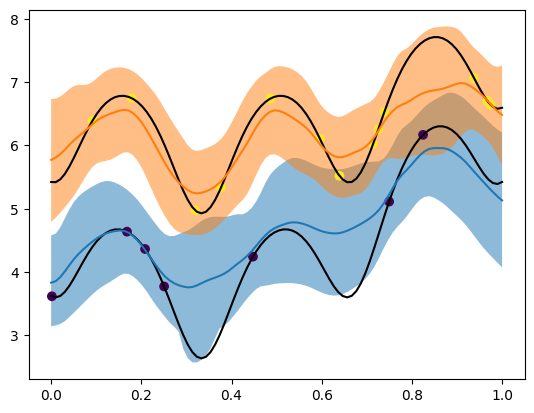

CoCaBO
here CoCaBO
GP (mat52 and O)


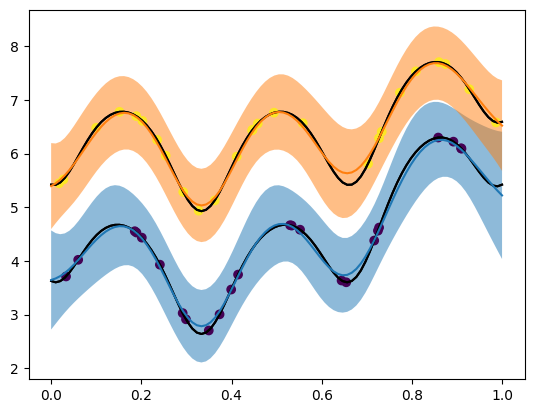

pfn_cocabo_51


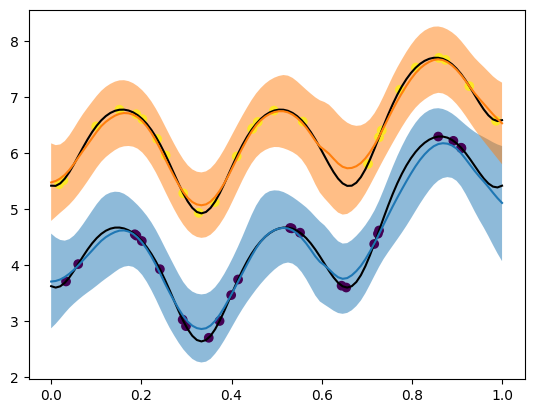

Casmopolitan
here Casmopolitan
GP (mat52 and TO)


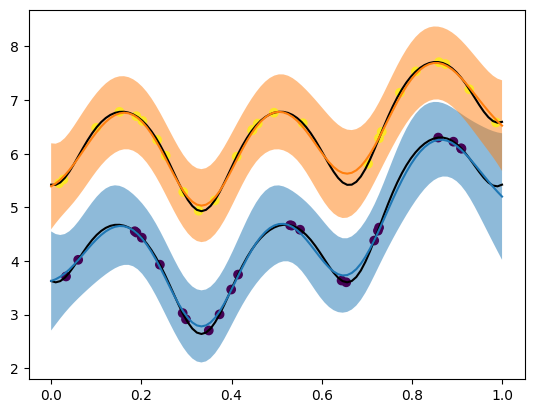

pfn_casmopolitan_16


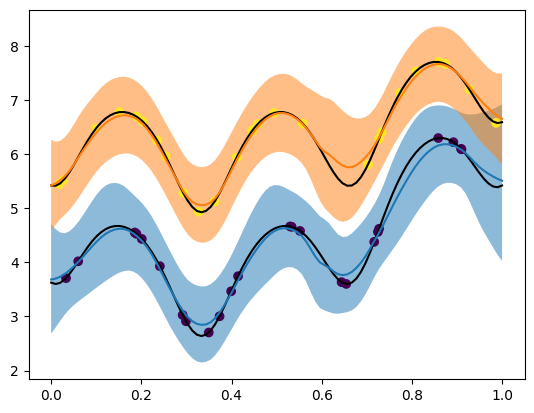

BODi
here BODi
GP (mat52 and HED-mat52)


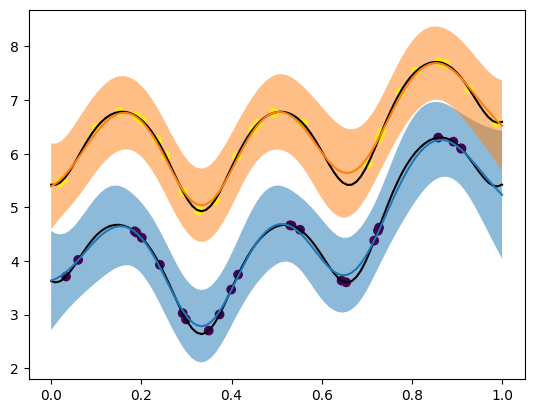

pfn_bodi_24


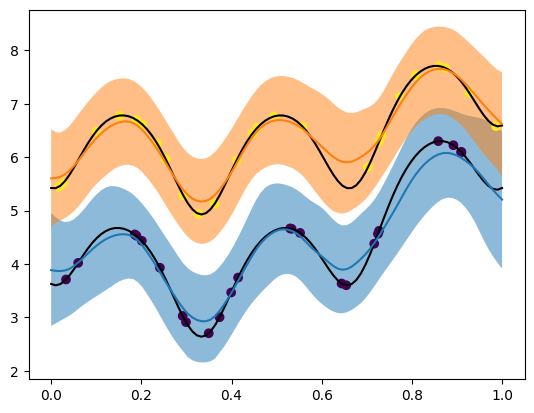

CoCaBO
here CoCaBO
GP (mat52 and O)


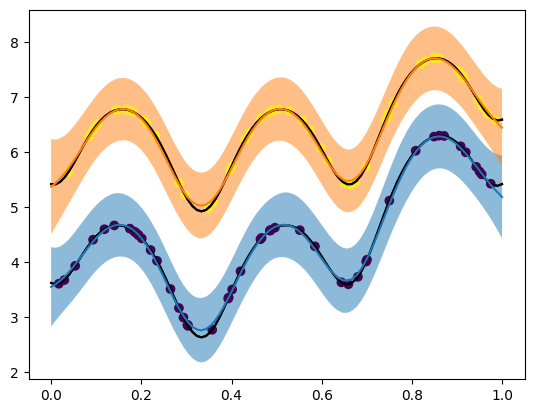

pfn_cocabo_51


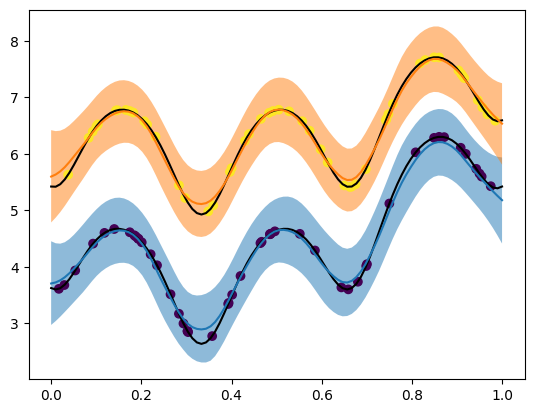

Casmopolitan
here Casmopolitan
GP (mat52 and TO)


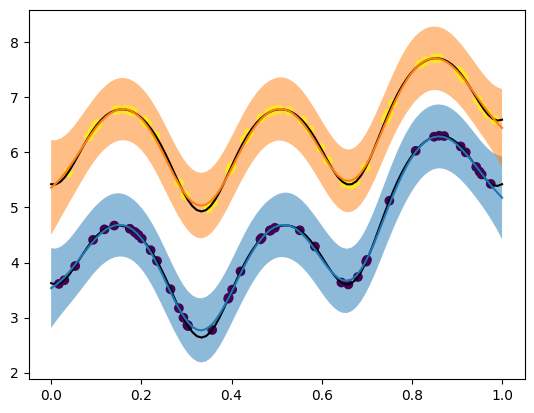

pfn_casmopolitan_16


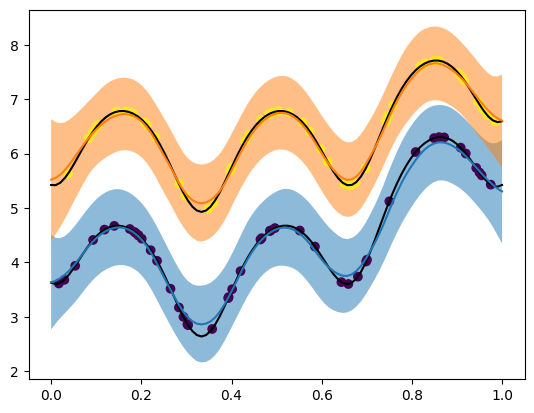

BODi
here BODi
GP (mat52 and HED-mat52)


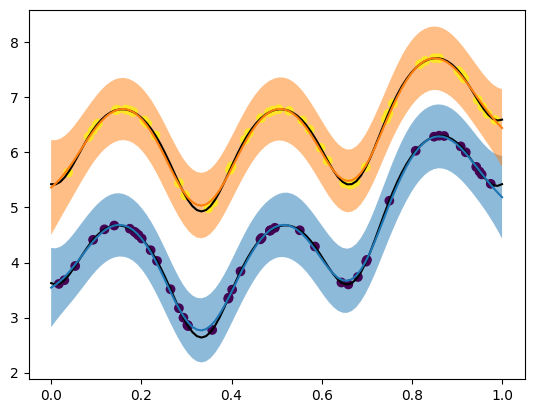

pfn_bodi_24


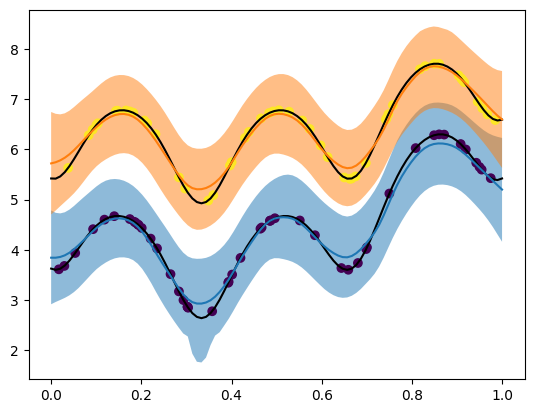

CoCaBO
here CoCaBO
GP (mat52 and O)


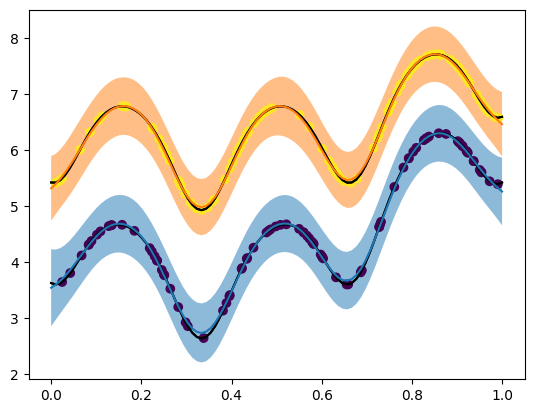

pfn_cocabo_51


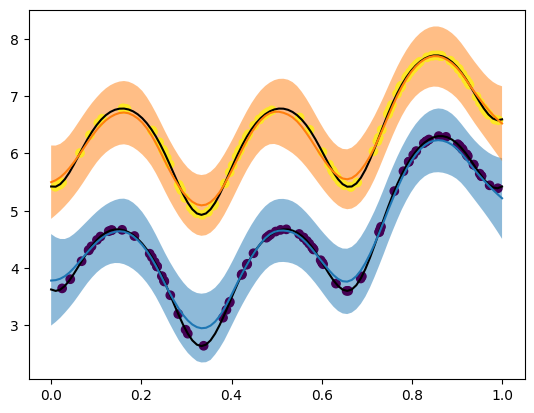

Casmopolitan
here Casmopolitan
GP (mat52 and TO)


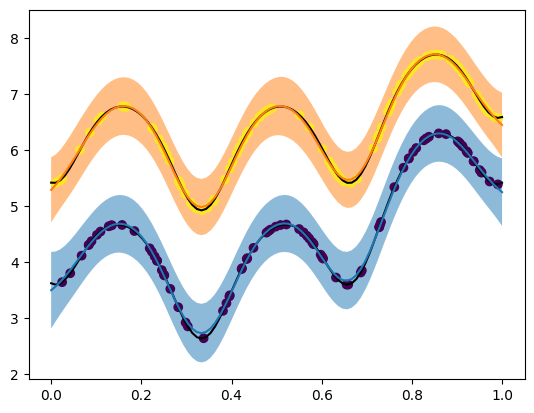

pfn_casmopolitan_16


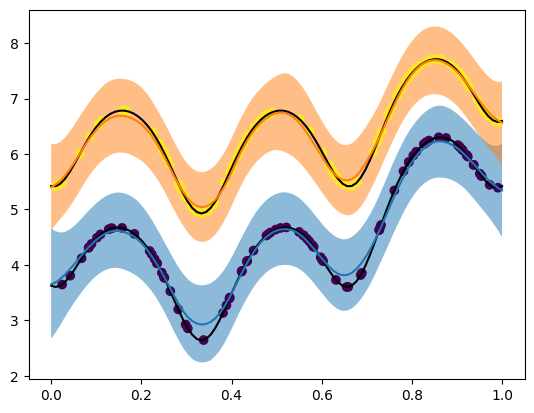

BODi
here BODi
GP (mat52 and HED-mat52)


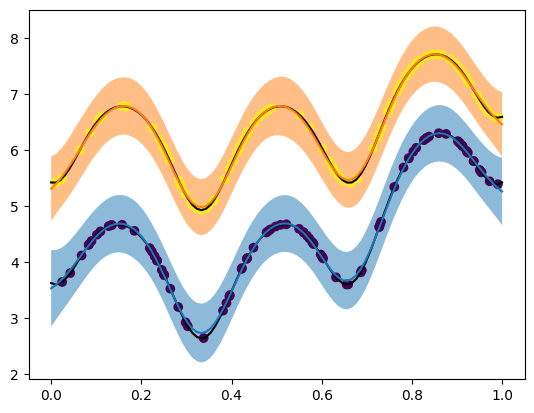

pfn_bodi_24


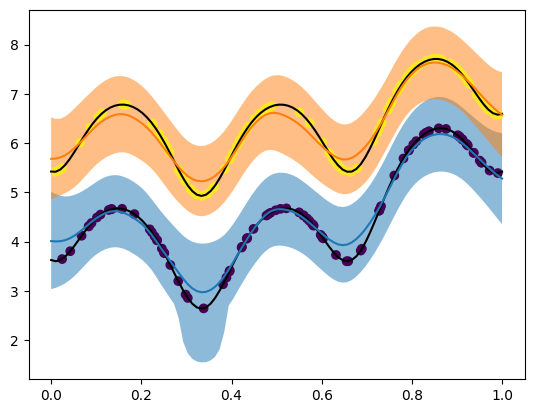

In [520]:
task_name = 'ackley'
task_kws = dict(variable_type=['num', 'nominal'],
                    num_dims=[1, 1],
                    num_categories=[2, 2])
task_kws = dict(variable_type=['num', 'nominal'],
                    num_dims=[1, 1],
                    lb=-1,
                    ub=2,
                    num_categories=[2, 2])
task = task_factory(task_name=task_name, **task_kws)
search_space = task.get_search_space()
seed = 111
np.random.seed(seed)
torch.manual_seed(seed)
set_random_seed(seed)

training_df = pd.DataFrame(columns = ['n_dat', 'category', 'x', 'y'])
output_df = pd.DataFrame(columns = ['n_dat', 'category', 'x', 'optimizer', 'optimizer_output', 'lb','ub', 'ground_truth'])

for i in [5, 10, 20, 50, 100, 200]:
    # create data
    X_pd = search_space.sample(i)
    x = search_space.transform(X_pd).to(torch.float32)
    y = task(X_pd)
    test_x = torch.vstack([torch.linspace(0, 1, 100).repeat(2), torch.zeros(200)]).T.to(torch.float32)
    test_x[100:, 1] = 1

    ground_truth = task(search_space.inverse_transform(test_x))
    plt.plot(test_x[:100,0].detach(), ground_truth[:100], c='black')
    plt.plot(test_x[100:,0].detach(), ground_truth[100:], c='black')

    training_df = pd.concat([training_df, pd.DataFrame({
        'n_dat': i,
        'category': x[:,1],
        'x': x[:,0],
        'y': y.flatten()
    })])


    
    for optimizer_name in ['CoCaBO', 'pfn_cocabo_51',
                           'Casmopolitan', 'pfn_casmopolitan_16',
                           'BODi', 'pfn_bodi_24']:
        print(optimizer_name)
        if optimizer_name[0:3] == 'pfn':
            optimizer_kwargs = {
                'pfn_file': f'trained_models/{optimizer_name}.pth',
                'acq_func': 'ei',
                'acq_optim_name': 'is',
                'dtype': torch.float32,
                #'device': 'cpu',
                'fast':True
            }
            mvpfn = MVPFNOptimizer(search_space=search_space, **optimizer_kwargs)

            mvpfn.observe(X_pd, y)
            logits = mvpfn.model_pfn.pfn(x, mvpfn.model_pfn.y_to_fit_y(torch.from_numpy(y).to(torch.float32)), test_x.to(torch.float32))
            mean = mvpfn.model_pfn.pfn.criterion.mean(logits)
            var = mvpfn.model_pfn.pfn.criterion.variance(logits)
            var = (var * (mvpfn.model_pfn.y_std ** 2))
            lower_pfn = mvpfn.model_pfn.pfn.criterion.icdf(logits, 0.025).flatten().detach()
            upper_pfn = mvpfn.model_pfn.pfn.criterion.icdf(logits, 0.975).flatten().detach()
            mean = mvpfn.model_pfn.fit_y_to_y(mean)
            lb = mvpfn.model_pfn.fit_y_to_y(lower_pfn)
            ub = mvpfn.model_pfn.fit_y_to_y(upper_pfn)
            mean = mean.detach().flatten()
            lb = lb.detach().flatten()
            ub = ub.detach().flatten()
        else:
            print('here', optimizer_name)
            cocabo = BO_ALGOS[optimizer_name].build_bo(search_space=search_space, n_init=2, device=torch.device("cpu"))
            _ = cocabo.model.fit(x, torch.from_numpy(y))
            print(cocabo.model.name)
            mean, var = cocabo.model.predict(test_x)
            mean = mean.detach().flatten()
            lb = (mean - 1.96 * torch.sqrt(var.flatten().detach())).detach().flatten()
            ub = (mean + 1.96 * torch.sqrt(var.flatten().detach())).detach().flatten()

        plt.plot(test_x[:100,0].detach(), ground_truth[:100], c='black')
        plt.plot(test_x[100:,0].detach(), ground_truth[100:], c='black')
    
        plt.plot(test_x[:100,0].detach(), mean[:100].detach())
        plt.plot(test_x[100:,0].detach(), mean[100:].detach())
        plt.fill_between(test_x[:100,0].detach(),
                           lb[:100],
                           ub[:100],
                           alpha=0.5)
        plt.fill_between(test_x[100:,0].detach(),
                           lb[100:],
                           ub[100:],
                           alpha=0.5)
        plt.scatter(x[:,0], y, c=x[:,1])

        output_df = pd.concat([output_df, pd.DataFrame({
            'n_dat': i,
            'category': test_x[:,1],
            'x': test_x[:,0],
            'optimizer': optimizer_name, 
            'optimizer_output': mean, 
            'lb': lb,
            'ub': ub,
            'ground_truth':ground_truth.flatten()
        })])

        plt.show()
        
training_df.to_csv('data_for_thesis_figures/example_model_fits_training_data.csv')
output_df.to_csv('data_for_thesis_figures/example_model_fits.csv')

# Ground Truth of synthetic functions

(chapter 5)

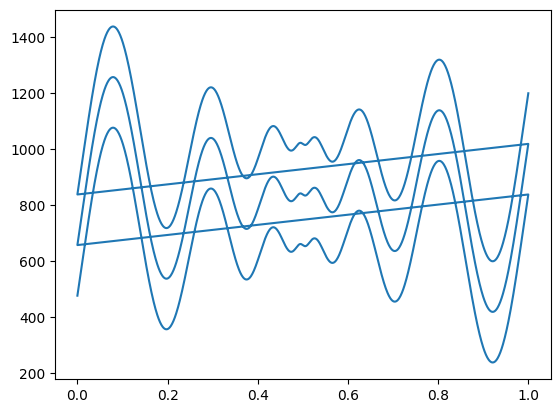

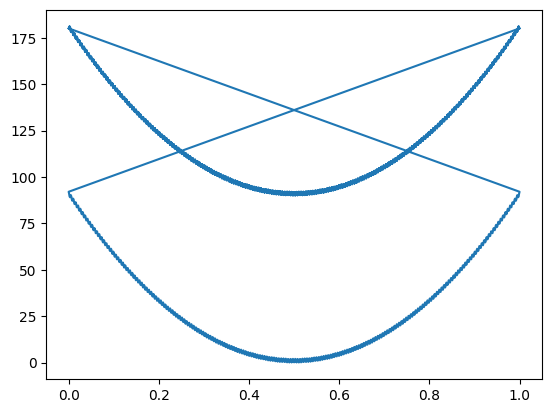

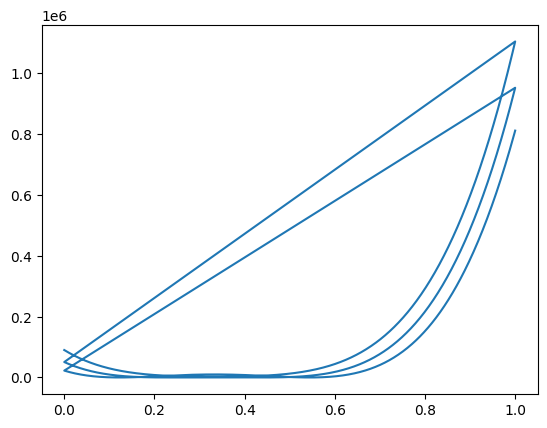

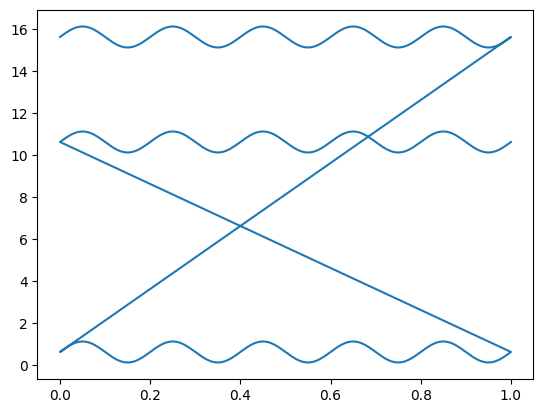

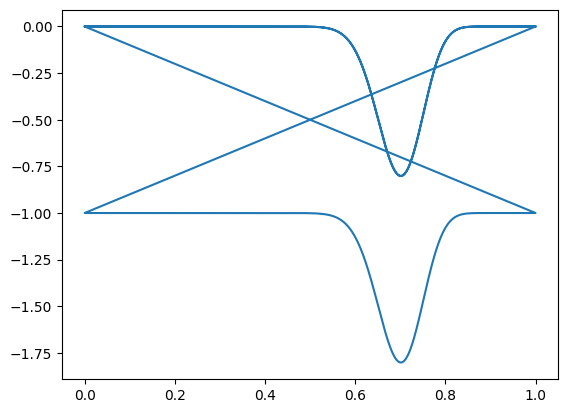

In [189]:
n_cats = 3
n_points = 1000

df = pd.DataFrame(columns=['task_name', 'x_cont', 'x_cat', 'y'])

for task_name in ['Schwefel', 'Griewank', 'Rosenbrock', 'Levy', 'Michalewicz']:
    task_kws = dict(variable_type=['num', 'nominal'],
                        num_dims=[1, 1],
                        num_categories=[2, n_cats])
    task = task_factory(task_name=task_name.lower(), **task_kws)
    search_space = task.get_search_space()
    
    search_space.transform(search_space.sample(10))
    
    x = torch.zeros([n_cats*n_points, 2])
    x[:, 0] = torch.linspace(0, 1, n_points).repeat(n_cats)
    x[:, 1] = torch.arange(n_cats).repeat_interleave(n_points)
    
    y = task(search_space.inverse_transform(x))

    
    plt.plot(x[:,0], y)
    plt.show()

    new_df = pd.DataFrame({'task_name': [task_name]*x.shape[0], 
                           'x_cont': x[:,0], 
                           'x_cat': x[:,1], 
                           'y':y.flatten()})

    df = pd.concat([df, new_df], ignore_index=True)

df.to_csv('data_for_thesis_figures/experimentSyntheticFunction.csv')

# Acq optim Test

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]


/var/folders/0y/jpktqnz11z7_nb_wxl7gpcc80000gn/T/ipykernel_2202/4127862535.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat['best_y_default'][i*n_guesses_per_round+j] = dat['new_y_default'][i*n_guesses_per_round:i*n_guesses_per_round+j+1].min()
/var/folders/0y/jpktqnz11z7_nb_wxl7gpcc80000gn/T/ipykernel_2202/4127862535.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat['best_y_fast'][i*n_guesses_per_round+j] = dat['new_y_fast'][i*n_guesses_per_round:i*n_guesses_per_round+j+1].min()


     n_cont_iter  mean_diff  mean_time
0  100 (default)  -0.062998  10.134664
1             10  -0.100506   2.181348
2              1   0.082227   1.380354
['3 restarts, 100 iterations' '2 restarts, 100 iterations'
 '1 restarts, 100 iterations' '3 restarts, 10 iterations'
 '3 restarts, 1 iterations' '1 restarts, 10 iterations'
 '1 restarts, 1 iterations' '2 restarts, 10 iterations'
 '2 restarts, 1 iterations']
                                  setup  mean_diff  mean_time
0  3 restarts, 100 iterations (default)   0.018425  10.035214
1            2 restarts, 100 iterations   0.050303   7.464224
2            1 restarts, 100 iterations   0.093756   4.324807
3             3 restarts, 10 iterations   0.047662   1.651925
4              3 restarts, 1 iterations   0.103537   0.785374
5             1 restarts, 10 iterations   0.192249   1.479748
6              1 restarts, 1 iterations   0.274410   1.205583
7             2 restarts, 10 iterations   0.052956   1.793636
8              2 restarts, 1

/var/folders/0y/jpktqnz11z7_nb_wxl7gpcc80000gn/T/ipykernel_2202/4127862535.py:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  acq_optim_dat['args'] = acq_optim_dat['is_n_restarts'].astype(str) + ' restarts, ' + \


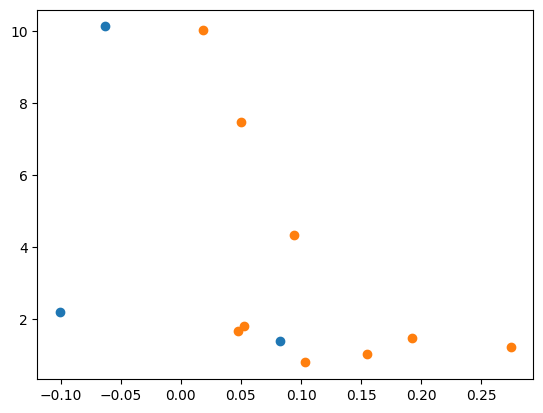

In [42]:
dat = pd.read_csv('acq_optimizer_experiment_results.csv')
print(dat['setup_number'].unique())
dat2 = pd.read_csv('acq_optimizer_experiment_results_2.csv')
dat2['setup_number'] = dat2['setup_number'] + dat['setup_number'].max() + 1
dat = pd.concat([dat, dat2], ignore_index=True)

# Get the best-score-so-far for each BO run
dat['best_y_default'] = 0.
dat['best_y_fast'] = 0.
n_guesses_per_round = dat['nth_guess'].max() + 1
for i in range(1+int(dat.shape[0]/n_guesses_per_round)):
    for j in range(n_guesses_per_round):
        dat['best_y_default'][i*n_guesses_per_round+j] = dat['new_y_default'][i*n_guesses_per_round:i*n_guesses_per_round+j+1].min()
        dat['best_y_fast'][i*n_guesses_per_round+j] = dat['new_y_fast'][i*n_guesses_per_round:i*n_guesses_per_round+j+1].min()

# get min and max values for scaling
min_values = dat.groupby(['task_name', 'optimizer_name'])[['best_y_default', 'best_y_fast']].min()
min_values['best_y'] = min_values[['best_y_default', 'best_y_fast']].min(axis=1)
min_values.drop(columns=['best_y_default', 'best_y_fast'], inplace=True)
max_values = dat.groupby(['task_name', 'optimizer_name'])[['best_y_default', 'best_y_fast']].max()
max_values['best_y'] = max_values[['best_y_default', 'best_y_fast']].max(axis=1)
max_values.drop(columns=['best_y_default', 'best_y_fast'], inplace=True)

# scale the data using the min and max values
dat = pd.merge(dat, min_values, on=['task_name', 'optimizer_name'], suffixes=('', '_min'))
dat = pd.merge(dat, max_values, on=['task_name', 'optimizer_name'], suffixes=('', '_max'))
dat['best_y_default_scaled'] = (dat['best_y_default'] - dat['best_y_min']) / (dat['best_y_max'] - dat['best_y_min'])
dat['best_y_fast_scaled'] = (dat['best_y_fast'] - dat['best_y_min']) / (dat['best_y_max'] - dat['best_y_min'])
dat['new_y_default_scaled'] = (dat['new_y_default'] - dat['best_y_min']) / (dat['best_y_max'] - dat['best_y_min'])
dat['new_y_fast_scaled'] = (dat['new_y_fast'] - dat['best_y_min']) / (dat['best_y_max'] - dat['best_y_min'])

# add observe and suggest times together
dat['default_time'] = dat['default_time_observe'] + dat['default_time_suggest']
dat['fast_time'] = dat['fast_time_observe'] + dat['fast_time_suggest']

acq_optim_dat = dat[dat['optimizer_name'].str.contains('MAB')]

mab_data = pd.DataFrame(columns=['n_cont_iter', 'mean_diff', 'mean_time'])

for i, c in enumerate(acq_optim_dat['mab_cont_n_iter'].unique()):
    #for j, task in enumerate(acq_optim_dat['task_name'].unique()):
    acq_dat = dat[dat['optimizer_name'].str.contains('MAB')]
    acq_dat = acq_dat[acq_dat['mab_cont_n_iter'] == c]
    acq_dat['diff'] = acq_dat['new_y_fast_scaled'] - acq_dat['new_y_default_scaled']
    mean_diff = acq_dat['diff'].mean()
    #plt.axhline(y=acq_dat['diff'].mean())
    #acq_dat = acq_dat.groupby('nth_guess')['diff'].mean().reset_index()

    default_label = ' (default)' if c == 100 else ''

    mab_data = mab_data.append({'n_cont_iter': str(c) + default_label, 
                                'mean_diff': acq_dat['diff'].mean(), 
                                'mean_time': acq_dat['fast_time'].mean()}, ignore_index=True)

print(mab_data)
plt.scatter(mab_data['mean_diff'], mab_data['mean_time'])

mab_data.to_csv('data_for_thesis_figures/acq_optim_test_mab.csv')

variables = ['is_n_restarts', 'is_nominal_tol', 'is_n_iter']

acq_optim_dat = dat[dat['optimizer_name'].str.contains('IS')]
acq_optim_dat['args'] = acq_optim_dat['is_n_restarts'].astype(str) + ' restarts, ' + \
                        acq_optim_dat['is_n_iter'].astype(str) + ' iterations'


print(acq_optim_dat['args'].unique())

is_data = pd.DataFrame(columns=['setup', 'mean_diff', 'mean_time'])

for i, setup in enumerate(acq_optim_dat['args'].unique()):
    acq_dat = acq_optim_dat.copy()#dat[dat['optimizer_name'].str.contains('IS')]
    acq_dat = acq_dat[acq_dat['args'] == setup]
    acq_dat['diff'] = acq_dat['new_y_fast_scaled'] - acq_dat['new_y_default_scaled']

    default_label = ' (default)' if setup == '3 restarts, 100 iterations' else ''
    
    is_data = is_data.append({'setup': setup + default_label, 
                              'mean_diff': acq_dat['diff'].mean(), 
                              'mean_time': acq_dat['fast_time'].mean()}, ignore_index=True)
plt.scatter(is_data['mean_diff'], is_data['mean_time'])
print(is_data)
is_data.to_csv('data_for_thesis_figures/acq_optim_test_is.csv')

# Evaluation Plots

casmo learning rate

[0.0001 0.0002 0.0003 0.0004 0.0006] [0.65941152 0.77730158 0.65892356 0.65893051 0.65935879]


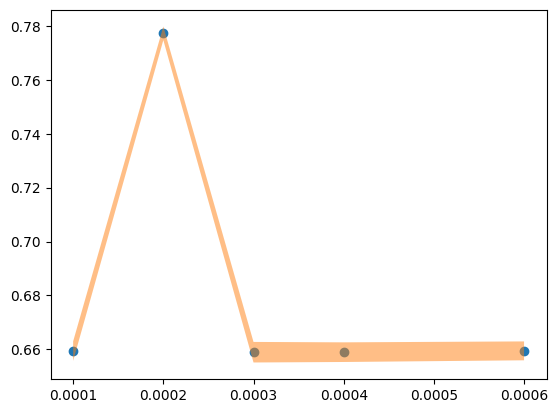

In [74]:
PFN_LIST = ['2', '5', '8','9','10']

lr = np.zeros(len(PFN_LIST))
mean_overlaps = np.zeros(len(PFN_LIST))
lb = np.zeros(len(PFN_LIST))
ub = np.zeros(len(PFN_LIST))

for i, pfn_number in enumerate(PFN_LIST):
    pfn = torch.load('trained_models/pfn_casmopolitan_'+pfn_number+'.pth')

    lr[i] = pfn.info['learning_rate']


    df = pd.read_csv('evaluation_data/divergence_results_'+pfn_number+'.csv')
    mean_overlaps[i] = df['overlap'].mean()
    lb[i] = bootstrap_lb(df['overlap'])
    ub[i] = bootstrap_ub(df['overlap'])

    # print(pfn_number, n_fake_data[i])

#print(n_fake_data, mean_overlaps)

sorted_indices = np.argsort(lr)

# Apply sorting to all tensors
lr = lr[sorted_indices]
mean_overlaps = mean_overlaps[sorted_indices]
lb = lb[sorted_indices]
ub = ub[sorted_indices]

df = pd.DataFrame({
    'learning_rate': lr,
    'mean_overlap': mean_overlaps,
    'lb': lb,
    'ub': ub
})

#df.to_csv('data_for_thesis_figures/casmopolitan_learning_rate.csv')
print(lr, mean_overlaps)
plt.scatter(lr, mean_overlaps)
plt.fill_between(lr,
                           lb,
                           ub,
                           alpha=0.5)
plt.show()

CoCaBO n_fake_data

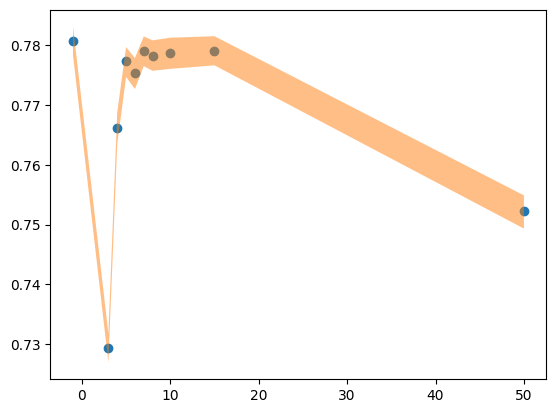

In [64]:
PFN_LIST = ['3', '4', '5']
for i in range(26,32):
    PFN_LIST += [str(i)]

PFN_LIST += ['41']

n_fake_data = np.zeros(len(PFN_LIST))
mean_overlaps = np.zeros(len(PFN_LIST))
lb = np.zeros(len(PFN_LIST))
ub = np.zeros(len(PFN_LIST))

for i, pfn_number in enumerate(PFN_LIST):
    pfn = torch.load('trained_models/pfn_cocabo_'+pfn_number+'.pth')
    try:
        n_fake_data[i] = pfn.info['training_hyperparameters']['n_fake_data']
    except:
        if pfn_number == '3':
            n_fake_data[i] = 50
        elif pfn_number == '4':
            n_fake_data[i] = 15
        elif pfn_number == '5':
            n_fake_data[i] = 5
        else:
            raisef

    df = pd.read_csv('evaluation_data/divergence_results_'+pfn_number+'.csv')
    mean_overlaps[i] = df['overlap'].mean()
    lb[i] = bootstrap_lb(df['overlap'])
    ub[i] = bootstrap_ub(df['overlap'])

    # print(pfn_number, n_fake_data[i])

#print(n_fake_data, mean_overlaps)

sorted_indices = np.argsort(n_fake_data)

# Apply sorting to all tensors
n_fake_data = n_fake_data[sorted_indices]
mean_overlaps = mean_overlaps[sorted_indices]
lb = lb[sorted_indices]
ub = ub[sorted_indices]

df = pd.DataFrame({
    'number_points': n_fake_data,
    'mean_overlap': mean_overlaps,
    'lb': lb,
    'ub': ub
})

df.to_csv('data_for_thesis_figures/cocabo_n_fake_data.csv')

plt.scatter(n_fake_data, mean_overlaps)
plt.fill_between(n_fake_data,
                           lb,
                           ub,
                           alpha=0.5)
plt.show()

Casmo noise scaling

['6', '14', '15', '16', '17', '18', '19']
[0.80802481 0.81139574 0.81228607 0.80826505 0.80747193 0.80638848
 0.80423031]


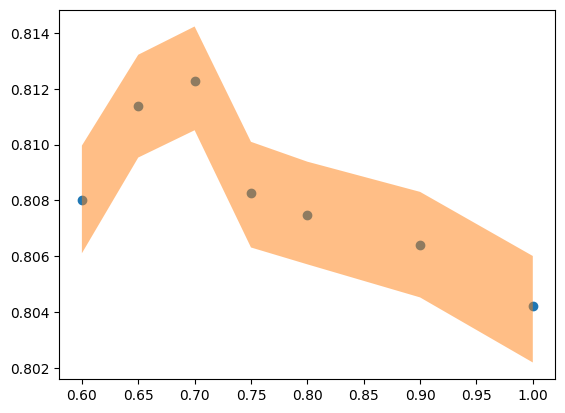

In [79]:
PFN_LIST = ['6']
for i in range(14,20):
    PFN_LIST += [str(i)]


noise_coef = np.zeros(len(PFN_LIST))
mean_overlaps = np.zeros(len(PFN_LIST))
lb = np.zeros(len(PFN_LIST))
ub = np.zeros(len(PFN_LIST))

for i, pfn_number in enumerate(PFN_LIST):
    pfn = torch.load('trained_models/pfn_casmopolitan_'+pfn_number+'.pth')

    if pfn_number == '6':
        noise_coef[i] = 1.0
    else:
        
        noise_coef[i] = pfn.info['training_hyperparameters']['observation_noise']


    df = pd.read_csv('casmo_evaluation_data/divergence_results_'+pfn_number+'.csv')
    mean_overlaps[i] = df['overlap'].mean()
    lb[i] = bootstrap_lb(df['overlap'])
    ub[i] = bootstrap_ub(df['overlap'])

    # print(pfn_number, n_fake_data[i])

#print(n_fake_data, mean_overlaps)

sorted_indices = np.argsort(noise_coef)

# Apply sorting to all tensors
noise_coef = noise_coef[sorted_indices]
mean_overlaps = mean_overlaps[sorted_indices]
lb = lb[sorted_indices]
ub = ub[sorted_indices]

df = pd.DataFrame({
    'noise_coef': noise_coef,
    'mean_overlap': mean_overlaps,
    'lb': lb,
    'ub': ub
})
print(PFN_LIST)
print(mean_overlaps)
df.to_csv('data_for_thesis_figures/casmopolitan_noise_coef.csv')

plt.scatter(noise_coef, mean_overlaps)
plt.fill_between(noise_coef,
                           lb,
                           ub,
                           alpha=0.5)
plt.show()

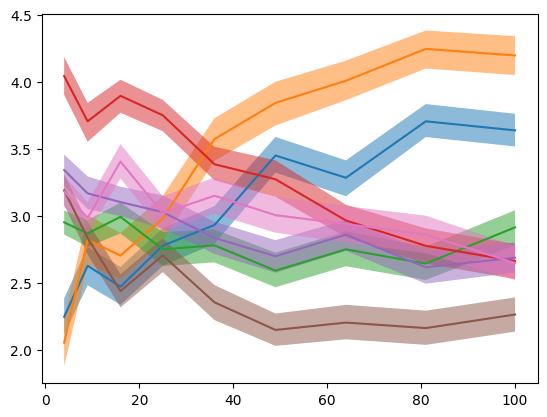

/var/folders/0y/jpktqnz11z7_nb_wxl7gpcc80000gn/T/ipykernel_37960/4290185460.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results['best_y_scaled'] = results.groupby('task_name')['best_y'].transform(rescale)


mean rank for  MVPFN_768,pfnAcqFunc0_ei_is 2.841625
mean rank for  MVPFN_768,pfnAcqFunc1_ei_is 2.74675
mean rank for  MVPFN_768,pfnAcqFunc2_ei_is 2.97225
mean rank for  MVPFN_768,pfnAcqFunc3_ei_is 2.8955
mean rank for  MVPFN_768,pfnAcqFunc4_ei_is 3.23675
mean rank for  MVPFN_768,pfnAcqFunc5_ei_is 2.89275
mean rank for  MVPFN_768,pfnAcqFunc6_ei_is 3.414375


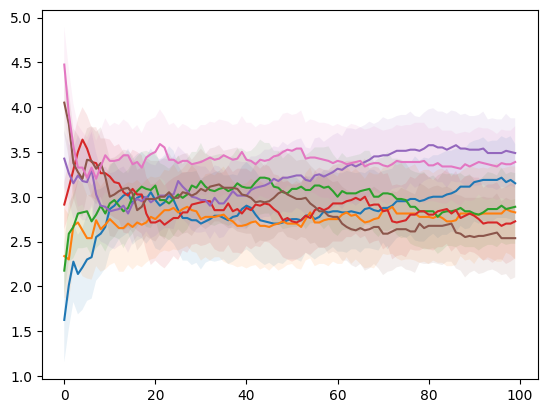

In [180]:
# mixed pfn

PFN_LIST = ['0', '1','2','3','4','5', '6']
loss = 'nll_raw'
regression_df_list = []
for i, pfn_no in enumerate(PFN_LIST):
    regression_df_list += [pd.read_csv('mixed_evaluation_data/regression_results_'+pfn_no+'.csv')]
    regression_df_list[i] = regression_df_list[i][regression_df_list[i]['model_name'] == 'PFN']
    regression_df_list[i]['PFN_number'] = pfn_no
# now we make ranking plot, using the raw loss calculations
regression_df = regression_df_list[0]
losses = np.array([df[loss[0:3]+'_raw'] for df in regression_df_list]).T
ranks = np.argsort(losses, axis=1)
ranks = np.argsort(ranks)
avg_ranks = np.zeros(len(PFN_LIST))
proportion_wins = np.zeros(len(PFN_LIST))

df = pd.DataFrame(columns = ['pfn_number', 'n_training_data', 'mean_rank', 'lb', 'ub'])

for i in range(ranks.shape[1]):
    regression_df[PFN_LIST[i]+'_rank'] = ranks[:, i]
    avg_ranks[i] = regression_df[PFN_LIST[i]+'_rank'].mean()
    proportion_wins[i] = (regression_df[PFN_LIST[i]+'_rank'] == 0).mean()
    mean = regression_df.groupby('n_training_data')[PFN_LIST[i]+'_rank'].mean()
    ub = regression_df.groupby('n_training_data')[PFN_LIST[i]+'_rank'].apply(bootstrap_ub)
    lb = regression_df.groupby('n_training_data')[PFN_LIST[i]+'_rank'].apply(bootstrap_lb)
    plt.plot(mean, label = PFN_LIST[i])
    plt.fill_between(mean.index.get_level_values('n_training_data'),
                           lb,
                           ub,
                           alpha=0.5)
    mini_df = pd.DataFrame({'pfn_number': [PFN_LIST[i]]*mean.shape[0], 
                            'n_training_data': mean.index.get_level_values('n_training_data'),
                            'mean_rank': mean, 
                            'lb': lb, 'ub': ub})
    df = pd.concat([df, mini_df])
plt.show()
df.to_csv('data_for_thesis_figures/mixed_eval_regression_ranking.csv')

########################################################################################################
########################################################################################################
BO_df_list = []
model_names_list = []
for i, pfn_no in enumerate(PFN_LIST):
    BO_df_list += [pd.read_csv('mixed_evaluation_data/BO_results_pfn_'+pfn_no+'_ei_is.csv')]
    BO_df_list[-1]['optimizer_name'] += str(pfn_no)+'_ei_is'
    BO_df_list[-1]['acq_func'] = 'ei'
    BO_df_list[-1]['acq_opt'] = 'is'
    BO_df_list[-1].reset_index(drop=True)
    model_names_list += [str(pfn_no)+'_ei_is']

results_full = pd.concat(BO_df_list, axis=0, ignore_index=False)

results_full['task_number'] = pd.factorize(results_full['task_name'])[0]

results = results_full[results_full['optimizer_name'].str.contains('pfnAcqFunc')]

def rescale(series):
    return (series - series.min()) / (series.max() - series.min())

results['best_y_scaled'] = results.groupby('task_name')['best_y'].transform(rescale)

#now lets do a rank plot!
BO_df = BO_df_list[0]
best_ys = np.array([df['best_y'] for df in BO_df_list]).T
ranks = np.argsort(best_ys, axis=1)
ranks = np.argsort(ranks, axis=1)
ranks = ranks.T.flatten()
results_full['rank'] = ranks

results = results_full[results_full['optimizer_name'].str.contains('pfnAcqFunc')]

df = pd.DataFrame(columns=['pfn_number', 'iteration', 'mean_rank', 'lb', 'ub'])

for i, optimizer_name in enumerate(results['optimizer_name'].unique()):
    rank_df = results[results['optimizer_name'] == optimizer_name]
    print('mean rank for ', optimizer_name, rank_df['rank'].mean())
    mean = rank_df.groupby('nth_guess')['rank'].mean()
    median = rank_df.groupby('nth_guess')['rank'].median()
    ub = rank_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
    lb = rank_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
    plt.plot(mean)
    plt.fill_between(mean.index.get_level_values('nth_guess'),
                       lb,
                       ub,
                       alpha=0.1)

    mini_df = pd.DataFrame({'pfn_number': [PFN_LIST[i]]*mean.shape[0], 
                            'iteration': mean.index.get_level_values('nth_guess'),
                            'mean_rank': mean, 
                            'lb': lb, 'ub': ub})
    df = pd.concat([df, mini_df])
df.to_csv('data_for_thesis_figures/mixed_eval_BO_ranking.csv')
plt.show()

# Timing Plots

we see roughly how observe+suggest time changes wrt number of observations

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
tensor([[1.0000e+02, 3.0127e-01, 1.9850e+00],
        [2.0000e+02, 4.7951e-01, 3.1172e+00],
        [3.0000e+02, 6.9567e-01, 4.3776e+00],
        [4.0000e+02, 1.1075e+00, 5.4543e+00],
        [5.0000e+02, 1.8601e+00, 6.7104e+00],
        [6.0000e+02, 2.3909e+00, 8.3966e+00],
        [7.0000e+02, 3.2626e+00, 1.0140e+01],
        [8.0000e+02, 4.4399e+00, 1.1381e+01],
        [9.0000e+02, 5.5926e+00, 1.3170e+01],
        [1.0000e+03, 7.0187e+00, 1.4949e+01],
        [1.1000e+03, 8.8499e+00, 1.8594e+01],
        [1.2000e+03, 9.7563e+00, 2.1461e+01],
        [1.3000e+03, 1.2955e+01, 2.4667e+01],
        [1.4000e+03, 1.3754e+01, 2.5669e+01],
        [1.5000e+03, 1.5836e+01, 2.8035e+01],
        [1.6000e+03, 1.9539e+01, 3.0478e+01],
        [1.7000e+03, 2.1042e+01, 3.3260e+01],
        [1.8000e+03, 2.4046e+01, 3.6901e+01],
        [1.9000e+03, 2.7866e+01, 4.3432e+01],
        [2.0000e+03, 3.2215e+01, 4.5214e+01]])


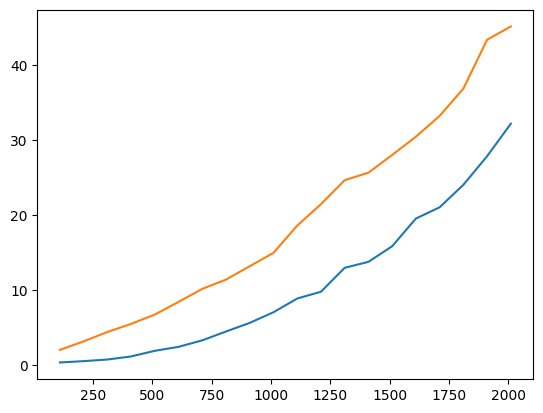

In [8]:
task_name = 'schwefel'
from mcbo.utils.stopwatch import Stopwatch
task_kws = dict(variable_type=['num', 'nominal'],
                    num_dims=[1, 1],
                    num_categories=[2, 2])

task = task_factory(task_name=task_name, **task_kws)

search_space = task.get_search_space()
n_iter = 20
n_init = 10
dat = torch.zeros([n_iter, 3])

suggest_stopwatch1 = Stopwatch()
observe_stopwatch1 = Stopwatch()
suggest_stopwatch2 = Stopwatch()
observe_stopwatch2 = Stopwatch()

optimizer1 = BO_ALGOS['Casmopolitan'].build_bo(search_space=search_space, n_init=10, device=torch.device("cpu"))
optimizer1.acq_optimizer.n_restarts = 2
optimizer1.acq_optimizer.nominal_tol = 100
optimizer1.acq_optimizer.n_iter = 10
optimizer1.model.max_training_dataset_size = 1000000


optimizer_kwargs = {
        'pfn_file': 'trained_models/pfn_cocabo_51.pth',
        'acq_func': 'ei',
        'acq_optim_name': 'is',
        #'device': 'cpu',
        'fast':True
    }

optimizer2 = MVPFNOptimizer(search_space=search_space,
                       **optimizer_kwargs)

  

# initialize
x_init = search_space.sample(n_init)
y_init = task(x_init)
optimizer1.initialize(x_init, y_init)
optimizer2.initialize(x_init, y_init)



# BO loop
for i in range(n_iter):
    print(i)
    x_big = search_space.sample(99)
    y_big = task(x_big)
    x = search_space.sample()
    y = task(x)
    dat[i,0] = 100*(i+1)

    optimizer1.observe(x_big, y_big)

    observe_stopwatch1.start()
    optimizer1.observe(x, y)
    observe_stopwatch1.stop()

    suggest_stopwatch1.start()
    optimizer1.suggest()
    suggest_stopwatch1.stop()

    dat[i, 1] = suggest_stopwatch1.get_elapsed_time() + observe_stopwatch1.get_elapsed_time()


    optimizer2.observe(x_big, y_big)

    observe_stopwatch2.start()
    optimizer2.observe(x, y)
    observe_stopwatch2.stop()

    suggest_stopwatch2.start()
    optimizer2.suggest()
    suggest_stopwatch2.stop()

    dat[i, 2] = suggest_stopwatch2.get_elapsed_time() + observe_stopwatch2.get_elapsed_time()

    

plt.plot(dat[:, 0]+n_init, dat[:, 1])
plt.plot(dat[:, 0]+n_init, dat[:, 2])
print(dat)
# blue is mcbo, orange is pfn

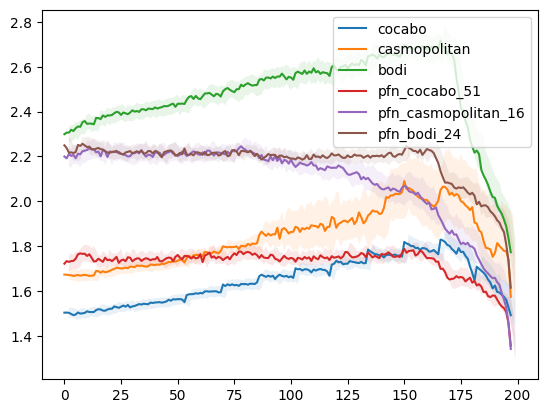

In [53]:
# time
big_df = get_big_df()
big_df = big_df[big_df['optimizer_name'] != 'random']
big_df = big_df[big_df['optimizer_name'] != 'pfn_mixed_5']
#optimizer_list = ['cocabo', 'pfn_cocabo_51']
#for task_name in ['xgboost_opt', 'schwefel', 'perm0', 'power_sum', 'michalewicz']:

time_df = pd.DataFrame(columns=['optimizer', 'iteration', 'mean_time', 'lb', 'ub'])

for optimizer_name in big_df['optimizer_name'].unique():
    df = big_df[big_df['optimizer_name'] == optimizer_name]
    df = df[df["nth_guess"]>1]
    df = df[df["nth_guess"]<200]
    mean = df.groupby('nth_guess')['time'].mean()
    mean_time = df.groupby('nth_guess')['time'].mean()

    plt.plot(np.arange(mean.shape[0]), mean, label=optimizer_name)
    #plt.plot(df['nth_guess'], df['time'], label=optimizer_name)
    ub = df.groupby('nth_guess')['time'].apply(bootstrap_ub)
    lb = df.groupby('nth_guess')['time'].apply(bootstrap_lb)
    plt.fill_between(mean.index.get_level_values('nth_guess'),
                       lb,
                       ub,
                       alpha=0.1)

    mini_df = pd.DataFrame({
        'optimizer': optimizer_name, 
        'iteration': mean.index.get_level_values('nth_guess'), 
        'mean_time': mean_time, 
        'lb': lb, 'ub':ub
    })

    time_df = pd.concat([time_df, mini_df])
plt.legend()
plt.show()

time_df.to_csv('data_for_thesis_figures/BO_time_experiment.csv')

pfn_bodi_24
pfn_casmopolitan_16
pfn_cocabo_51
          optimizer  iteration  mean_time        lb        ub
110     pfn_bodi_24      110.0   2.703162  2.416777  3.063908
210     pfn_bodi_24      210.0   2.981260  2.628047  3.380040
310     pfn_bodi_24      310.0   2.945514  2.662562  3.250121
410     pfn_bodi_24      410.0   3.074006  2.720660  3.410012
510     pfn_bodi_24      510.0   3.388601  3.119602  3.653373
...             ...        ...        ...       ...       ...
2510  pfn_cocabo_51     2510.0   6.994010  5.865373  8.127033
2610  pfn_cocabo_51     2610.0   6.592991  5.483474  7.603424
2710  pfn_cocabo_51     2710.0   7.160697  6.084979  8.239415
2810  pfn_cocabo_51     2810.0   6.592084  5.562132  7.546119
2910  pfn_cocabo_51     2910.0   5.668118  4.603807  6.827732

[87 rows x 5 columns]


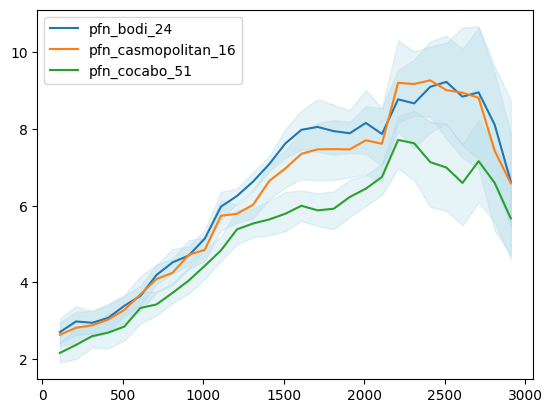

In [413]:
optimizer_names = ['pfn_bodi_24', 'pfn_casmopolitan_16', 'pfn_cocabo_51', 'bodi', 'casmopolitan', 'cocabo']

deeptime_df = pd.DataFrame(columns = ['optimizer', 'iteration', 'mean_time', 'lb', 'ub'])

for opt in optimizer_names:

    opt_df = pd.DataFrame(columns = ['optimizer_name', 'task_name', 'num_dims', 'cat_dims', 'seed',
       'setup_number', 'nth_guess', 'time_observe', 'time_suggest', 'new_y',
       'best_y'])
    
    for seed in range(100, 111):
        try:
            df = pd.read_csv(f'deeptime_experiment_results/BO_deeptime_{seed}_schwefel_{opt}.csv')
            #print(opt, seed, df.shape)
            if df.shape[0] > 30:
                df = df.dropna()
                assert df.shape[0] == 30, df.shape[0]

            opt_df = pd.concat([opt_df, df])
                
        except FileNotFoundError:
            #print(opt, seed, "NO DATA")
            pass

    opt_df = opt_df[opt_df['nth_guess'] > 20]
    opt_df['time'] = opt_df['time_suggest'] + opt_df['time_observe']
    mean_time = opt_df.groupby('nth_guess')['time'].mean()
    plt.plot(mean_time, label=opt)

    min_time = opt_df.groupby('nth_guess')['time'].min()
    max_time = opt_df.groupby('nth_guess')['time'].max()

    x = np.array(opt_df['nth_guess'].unique()).astype(float)

    ub = opt_df.groupby('nth_guess')['time'].apply(bootstrap_ub)
    lb = opt_df.groupby('nth_guess')['time'].apply(bootstrap_lb)

    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)
    print(opt)
    mini_df = pd.DataFrame({
        'optimizer': opt, 
        'iteration': x, 
        'mean_time': mean_time, 
        'lb': lb, 
        'ub': ub
    })

    deeptime_df = pd.concat([deeptime_df, mini_df])

print(deeptime_df)
deeptime_df.to_csv('data_for_thesis_figures/deeptime_BO_experiment.csv')

plt.legend()
#pd.read_csv(f'deeptime_experiment_results/BO_deeptime_{str(106)}_schwefel_{"cocabo"}.csv')

# BO Experiment Results

We plot some experiment results

In [3]:
optimizer_list = ['random', 'cocabo', 'casmopolitan', 'bodi', 
                  'pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24', 'pfn_mixed_5']
task_list = ['xgboost_opt', 'schwefel', 'michalewicz', 'griewank', 'rosenbrock', 'levy']
seed_list = [seed for seed in range(5000,5030)]
xgboost_seed_list = [9876, 5432]

opt_to_formal_name = {
    'random': 'Random Baseline', 
    'cocabo': 'CoCaBO', 
    'casmopolitan': 'Casmopolitan', 
    'bodi': 'BODi', 
    'pfn_cocabo_51': 'PFN-CoCaBO', 
    'pfn_casmopolitan_16': 'PFN-Casmopolitan', 
    'pfn_bodi_24': 'PFN-BODi',
    'pfn_mixed_5': 'PFN-Mixed'
}

save_csvs = True

def get_big_df():
    optimizer_list = ['random', 'cocabo', 'casmopolitan', 'bodi', 
                      'pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24', 'pfn_mixed_5']
    task_list = ['xgboost_opt', 'schwefel', 'michalewicz', 'griewank', 'rosenbrock', 'levy']
    seed_list = [seed for seed in range(5000,5030)]
    xgboost_seed_list = [9876, 5432]
    
    big_df = pd.DataFrame(columns = pd.read_csv(f'experiment_results/BO_schwefel_cocabo_5000.csv').columns)
    # first we do xgboost
    for optimizer_name in optimizer_list:
        for seed in xgboost_seed_list:
            mini_df = pd.read_csv(f'experiment_results/BO_xgboost_opt_{optimizer_name}_{str(seed)}.csv')
            mini_df.dropna(inplace=True)
            mini_df['optimizer_name'] = optimizer_name
            assert mini_df.shape[0] == 3015
            big_df = pd.concat([big_df, mini_df])
    # and now the rest of the tasks
    for task_name in task_list[1:]:
        for optimizer_name in optimizer_list:
            for seed in seed_list:
                try:
                    mini_df = pd.read_csv(f'experiment_results/BO_{task_name}_{optimizer_name}_{str(seed)}.csv')
                    mini_df.dropna(inplace=True)
                    mini_df['optimizer_name'] = optimizer_name
                    big_df = pd.concat([big_df, mini_df])
                except: print(task_name, optimizer_name, seed)
                assert mini_df.shape[0] == 201
    
    int_cols = ['nth_guess', 'setup_number', 'num_dims', 'cat_dims', 'seed']
    big_df[int_cols] = big_df[int_cols].astype(int)

    big_df['time'] = big_df['time_suggest'] + big_df['time_observe']
    big_df['n_dims'] = big_df['num_dims'] + big_df['cat_dims']

    return big_df

big_df = get_big_df()
big_df.shape
# should be 289440, 13

(289440, 13)

#### random seed sanity check:

we check the variance of the 0th guess across all optimizers

In [34]:
test_df = big_df[big_df['nth_guess'] == 0]
starting_variation = test_df.groupby(['task_name', 'seed', 'setup_number'])['best_y'].var()
(starting_variation > 0).sum()

0

### BO trajectories

xgboost_opt


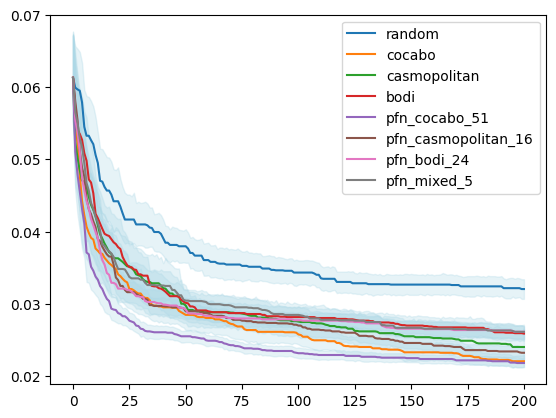

schwefel


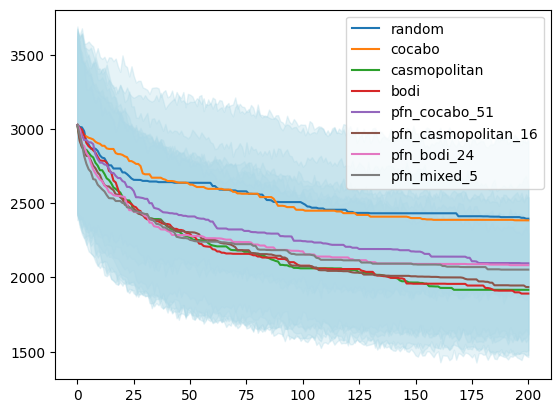

michalewicz


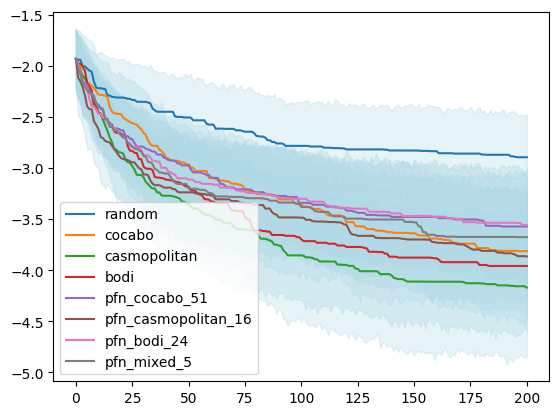

griewank


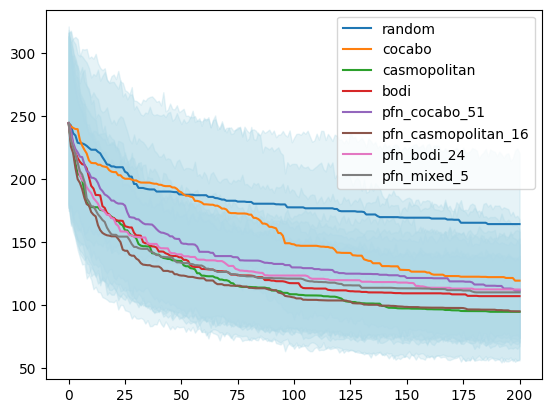

rosenbrock


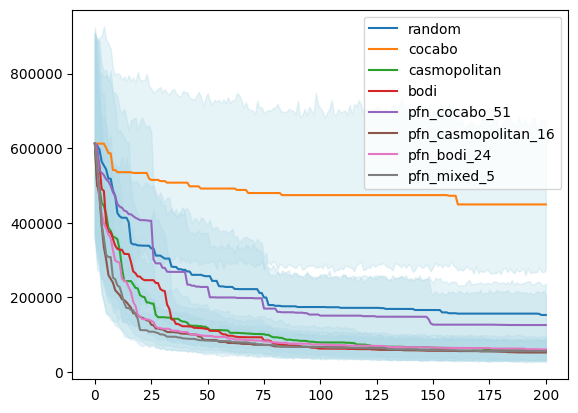

levy


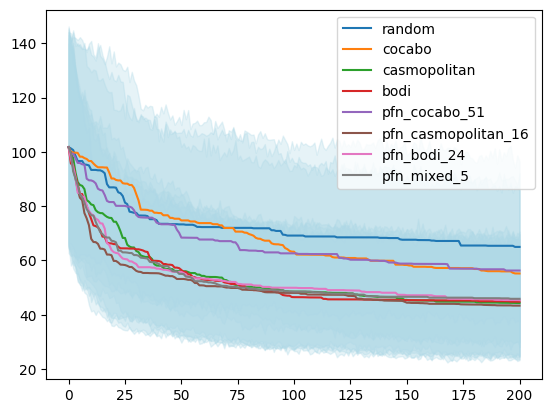

In [35]:
big_df = get_big_df()

rank_df = pd.DataFrame(columns=['optimizer', 'task', 'iteration', 'mean_rank','lb','ub'])

for task_name in big_df['task_name'].unique():
    print(task_name)
    for optimizer_name in big_df['optimizer_name'].unique():
        df = big_df[(big_df['optimizer_name']==optimizer_name) * (big_df['task_name']==task_name)]
        best_y = df.groupby('nth_guess')['best_y'].mean()
        ub = df.groupby('nth_guess')['best_y'].apply(bootstrap_ub)
        lb = df.groupby('nth_guess')['best_y'].apply(bootstrap_lb)
        x = best_y.index.get_level_values('nth_guess')
        
        plt.plot(x, best_y, label=optimizer_name)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

        rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer': opt_to_formal_name[optimizer_name], 
            'task': task_name,
            'iteration': x, 
            'best_y': best_y,
            'lb':lb,
            'ub':ub
        })])
    plt.legend()
    plt.show()

if save_csvs:
    rank_df.to_csv('data_for_thesis_figures/BO_trajectories.csv')

### Why is cocabo worse than random? When is pfn_bodi better than bodi??

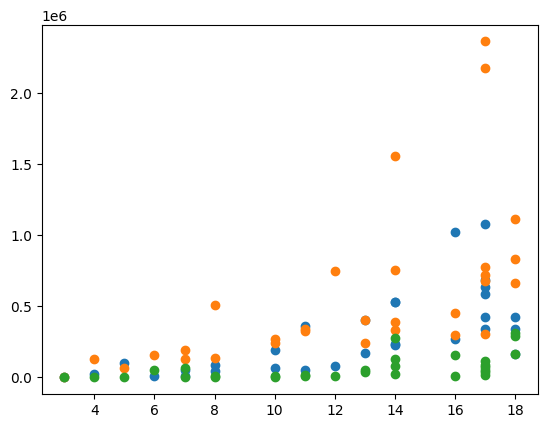

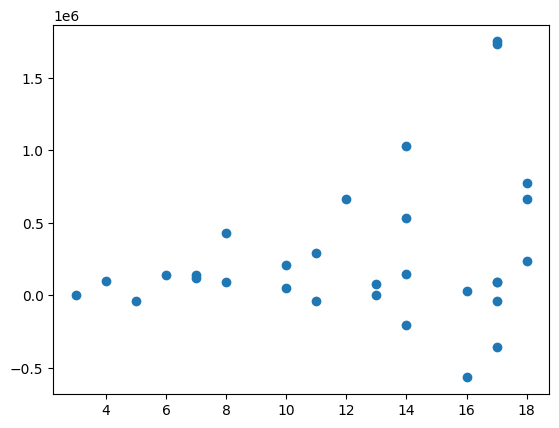

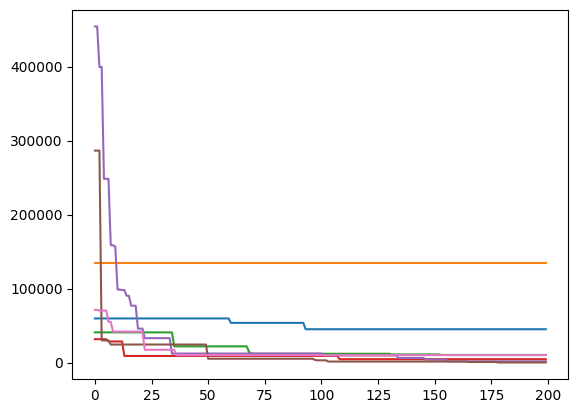

In [367]:
cocabo = pd.concat([pd.read_csv(f'experiment_results/BO_rosenbrock_cocabo{seed}.csv') for seed in seed_list], ignore_index=True)
cocabo = cocabo[cocabo['nth_guess'] == cocabo['nth_guess'].max()]
cocabo = cocabo[cocabo['task_name'] == 'rosenbrock']
random = pd.concat([pd.read_csv(f'experiment_results/BO_rosenbrock_random{seed}.csv') for seed in seed_list], ignore_index=True)
random = random[random['nth_guess'] == cocabo['nth_guess'].max()]
random = random[random['task_name'] == 'rosenbrock']
casmo = pd.concat([pd.read_csv(f'experiment_results/BO_rosenbrock_casmopolitan{seed}.csv') for seed in seed_list], ignore_index=True)
casmo = casmo[casmo['nth_guess'] == cocabo['nth_guess'].max()]
casmo = casmo[casmo['task_name'] == 'rosenbrock']
cocabo['n_dims'] = cocabo['num_dims']+cocabo['cat_dims']
plt.scatter(cocabo['n_dims'], random['best_y'])
plt.scatter(cocabo['n_dims'], cocabo['best_y'])
plt.scatter(cocabo['n_dims'], casmo['best_y'])
plt.show()
plt.scatter(cocabo['num_dims']+cocabo['cat_dims'], cocabo['best_y']-random['best_y'])
plt.show()

setup_no = cocabo[cocabo['best_y'] == cocabo['best_y'].max()]['setup_number'].item()
seed = cocabo[cocabo['best_y'] == cocabo['best_y'].max()]['seed'].item()
for opt in optimizer_list:
    df = pd.concat([pd.read_csv(f'experiment_results/BO_rosenbrock_{opt}{seed}.csv') for seed in seed_list], ignore_index=True)
    df = df[df['seed']==seed]
    df = df[df['setup_number']==1]
    plt.plot(df['nth_guess'], df['best_y'])
    if opt == '':
        plt.scatter(df['nth_guess'], df['new_y'])

## Average difference in best y

(289440, 13)
(36180, 12)
xgboost_opt


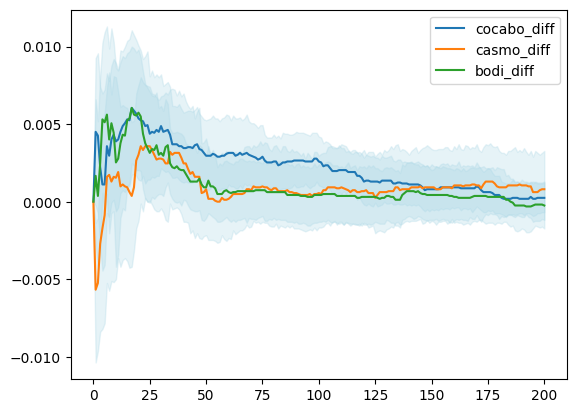

schwefel


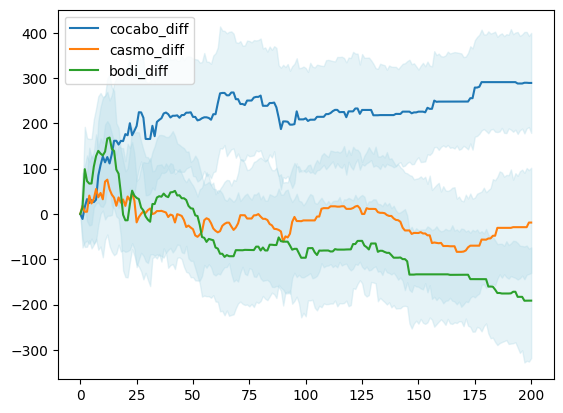

michalewicz


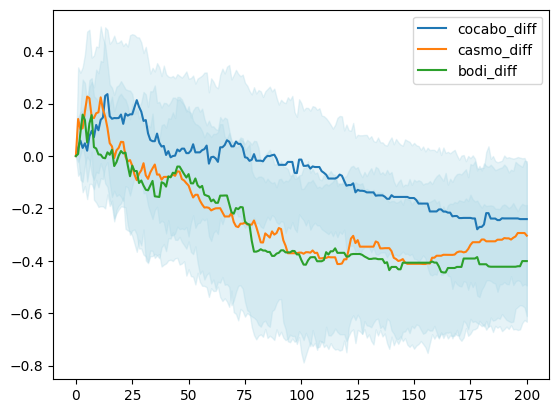

griewank


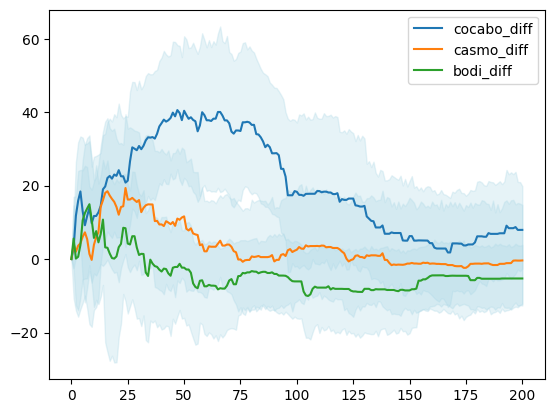

rosenbrock


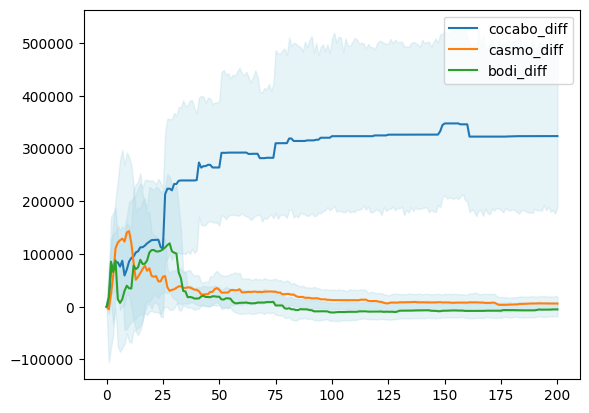

levy


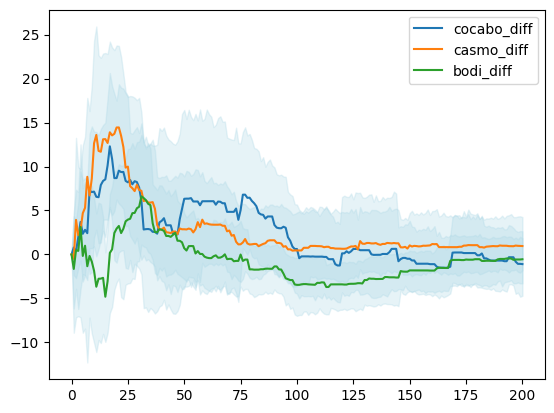

In [36]:
df = get_big_df()

print(df.shape)
df = df.pivot(columns='optimizer_name', index=['task_name','seed','setup_number','nth_guess'], values='best_y')
df = df.reset_index()
print(df.shape)
df['cocabo_diff'] = df['cocabo'] - df['pfn_cocabo_51'] 
df['casmo_diff'] = df['casmopolitan'] - df['pfn_casmopolitan_16'] 
df['bodi_diff'] = df['bodi'] - df['pfn_bodi_24'] 

prior_dict = {'cocabo_diff': 'PFN-CoCaBO', 
              'casmo_diff': 'PFN-Casmopolitan', 
              'bodi_diff': 'PFN-BODi'}
diff_df = pd.DataFrame(columns=['optimizer', 'task', 'iteration', 'difference', 'lb', 'ub'])
for task_name in task_list:
    print(task_name)
    for i in ['cocabo_diff', 'casmo_diff', 'bodi_diff']:
        mini_df = df[df['task_name'] == task_name]
        best_y = mini_df.groupby('nth_guess')[i].mean()
        ub = mini_df.groupby('nth_guess')[i].apply(bootstrap_ub)
        lb = mini_df.groupby('nth_guess')[i].apply(bootstrap_lb)
        x = best_y.index.get_level_values('nth_guess')
        plt.plot(x, best_y, label=i)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)
        diff_df = pd.concat([diff_df, pd.DataFrame({
            'optimizer': prior_dict[i], 
            'task': task_name, 
            'iteration': x,
            'difference': best_y, 
            'lb': lb, 
            'ub': ub
        })])
    plt.legend()
    plt.show()
if save_csvs:
    diff_df.to_csv('data_for_thesis_figures/diff_in_best_y.csv')

### Ranking Plot

(253260, 13)
(36180, 11)
(253260, 7)
griewank


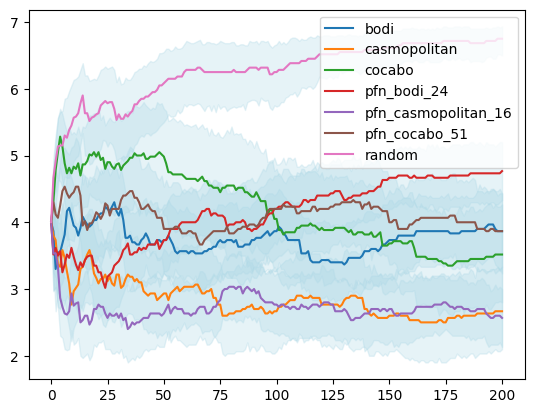

levy


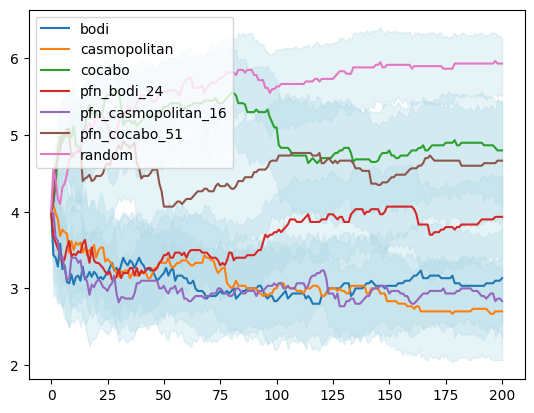

michalewicz


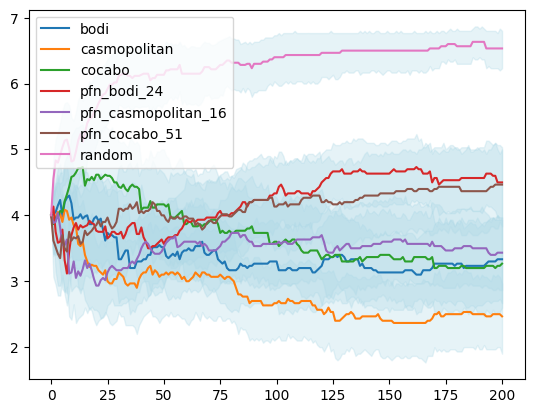

rosenbrock


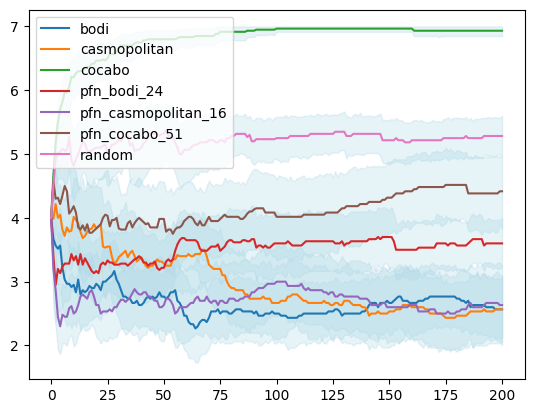

schwefel


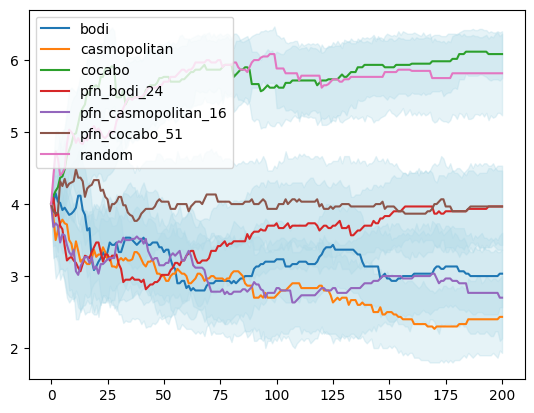

xgboost_opt


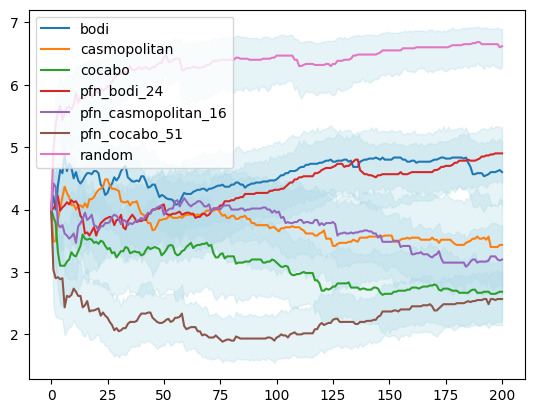

all tasks


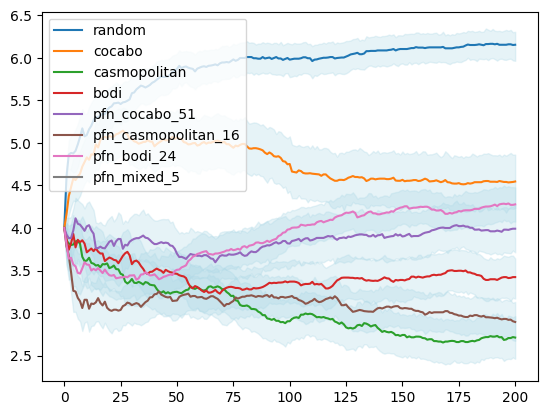

In [37]:
df = get_big_df()
df = df[df['optimizer_name'] != 'pfn_mixed_5']
optimizers = df['optimizer_name'].unique()

print(df.shape)
df = df.pivot(columns='optimizer_name', index=['task_name','seed','setup_number','nth_guess'], values='best_y')
df = df.reset_index()
print(df.shape)
df[optimizers] = df[optimizers].rank(axis=1)
df = df.melt(['task_name','seed','setup_number','nth_guess'])
df['rank'] = df['value']
print(df.shape)

rank_df = pd.DataFrame(columns=['optimizer', 'task', 'iteration', 'mean_rank','lb','ub'])

for task_name in df['task_name'].unique():
    for optimizer_name in df['optimizer_name'].unique():
        mini_df = df[(df['task_name']==task_name) * (df['optimizer_name']==optimizer_name)]
        mean_rank = mini_df.groupby('nth_guess')['rank'].mean()
        plt.plot(mean_rank, label=optimizer_name)
        
        x = np.array(mini_df['nth_guess'].unique()).astype(float)
        ub = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
        lb = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

        rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer': opt_to_formal_name[optimizer_name], 
            'task': task_name,
            'iteration': x, 
            'mean_rank': mean_rank,
            'lb':lb,
            'ub':ub
        })])
        
    print(task_name)
    plt.legend()
    plt.show()
# rank_df.to_csv('data_for_thesis_figures/BO_ranking_specific_tasks.csv')

print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer', 'iteration', 'mean_rank','lb','ub'])
for optimizer_name in optimizer_list:
    mini_df = df[(df['optimizer_name']==optimizer_name)]
    mean_rank = mini_df.groupby('nth_guess')['rank'].mean()
    plt.plot(mean_rank, label=optimizer_name)

    x = np.array(mini_df['nth_guess'].unique()).astype(float)
    ub = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
    lb = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    rank_df = pd.concat([rank_df,pd.DataFrame({
        'optimizer': opt_to_formal_name[optimizer_name], 
        'task': 'All Tasks',
        'iteration': x, 
        'mean_rank': mean_rank,
        'lb':lb,
        'ub':ub
    })])

if save_csvs:
    rank_df.to_csv('data_for_thesis_figures/BO_ranking_all_tasks.csv')
plt.legend()
plt.show()

### proportion wins vs prior

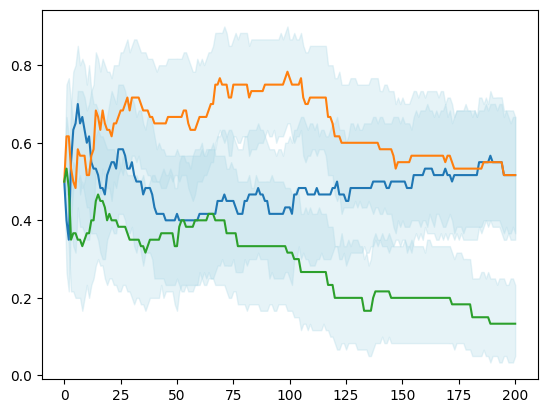

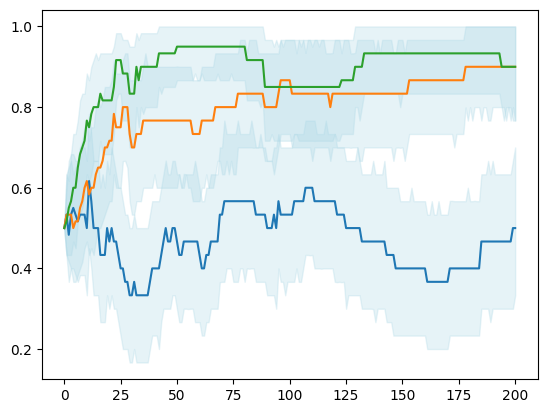

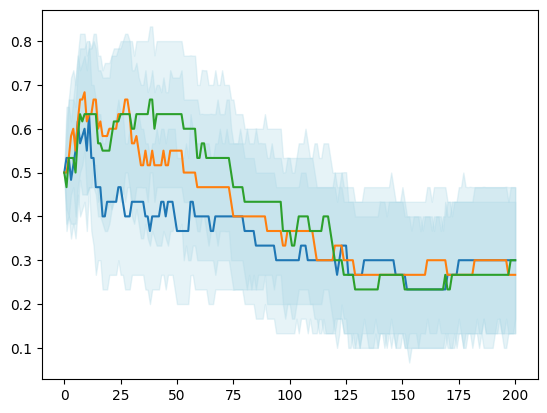

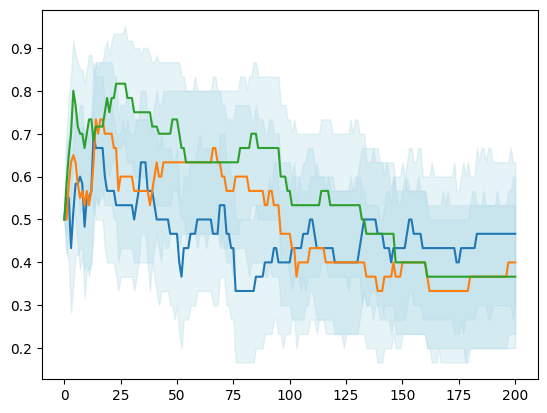

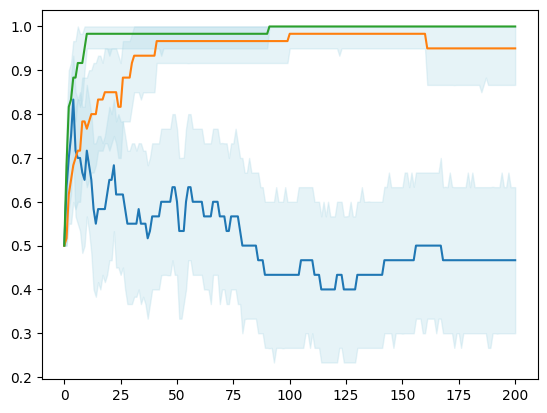

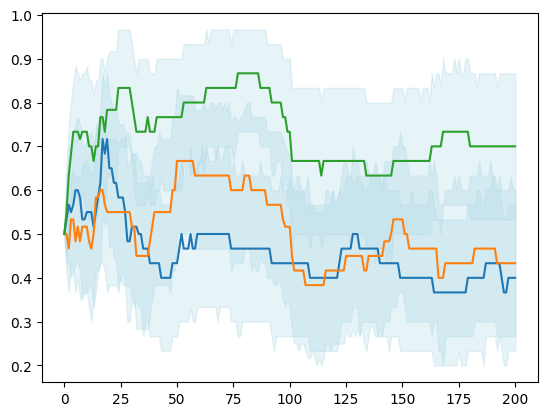

all tasks


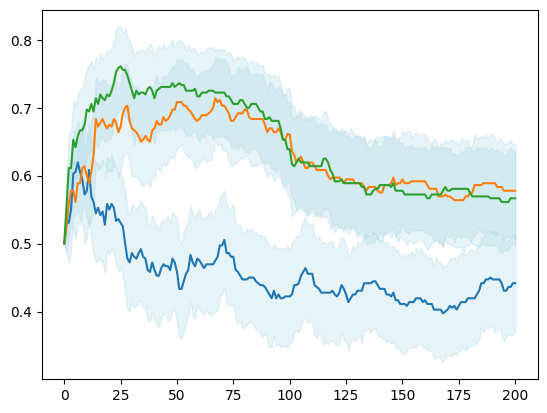

In [38]:
formal_name_1v1_dict = {
    'pfn_casmopolitan_16_1v1_rank': 'PFN-Casmopolitan', 
    'pfn_cocabo_51_1v1_rank': 'PFN-CoCaBO', 
    'pfn_bodi_24_1v1_rank': 'PFN-BODi'
}

df = get_big_df()
optimizers = df['optimizer_name'].unique()

df = df.pivot(columns='optimizer_name', index=['task_name','seed','setup_number','nth_guess'], values='best_y')
df = df.reset_index()
df[optimizer_list] = df[optimizer_list].rank(axis=1)
df['pfn_casmopolitan_16_1v1_rank'] = (df['pfn_casmopolitan_16'] < df['casmopolitan']) + 0.5 * (df['pfn_casmopolitan_16'] == df['casmopolitan'])
df['pfn_cocabo_51_1v1_rank'] = (df['pfn_cocabo_51'] < df['cocabo']) + 0.5 * (df['pfn_cocabo_51'] == df['cocabo'])
df['pfn_bodi_24_1v1_rank'] = (df['pfn_bodi_24'] < df['cocabo']) + 0.5 * (df['pfn_bodi_24'] == df['cocabo'])

rank_df = pd.DataFrame(columns=['optimizer', 'task_name', 'iteration', 'mean_rank','lb','ub'])

for task_name in task_list:
    for i in ['pfn_casmopolitan_16_1v1_rank', 'pfn_cocabo_51_1v1_rank', 'pfn_bodi_24_1v1_rank']:
        mini_df = df[df['task_name'] == task_name]
        mean_prop = mini_df.groupby('nth_guess')[i].mean()
        plt.plot(mean_prop)

        x = np.array(mini_df['nth_guess'].unique()).astype(float)
        ub = mini_df.groupby('nth_guess')[i].apply(bootstrap_ub)
        lb = mini_df.groupby('nth_guess')[i].apply(bootstrap_lb)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)
    
        rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer': formal_name_1v1_dict[i], 
            'task_name': task_name,
            'iteration': x, 
            'mean_proportion': mean_prop,
            'lb':lb,
            'ub':ub
        })])
    plt.show()
print('all tasks')
for i in ['pfn_casmopolitan_16_1v1_rank', 'pfn_cocabo_51_1v1_rank', 'pfn_bodi_24_1v1_rank']:
    mean_prop = df.groupby('nth_guess')[i].mean()
    plt.plot(mean_prop)

    x = np.array(df['nth_guess'].unique()).astype(float)
    ub = df.groupby('nth_guess')[i].apply(bootstrap_ub)
    lb = df.groupby('nth_guess')[i].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    rank_df = pd.concat([rank_df,pd.DataFrame({
        'optimizer': formal_name_1v1_dict[i], 
        'task_name': 'All Tasks',
        'iteration': x, 
        'mean_proportion': mean_prop,
        'lb':lb,
        'ub':ub
    })])
plt.show()
if save_csvs:
    rank_df.to_csv('data_for_thesis_figures/BO_1v1.csv')


# Regression Plots

schwefel


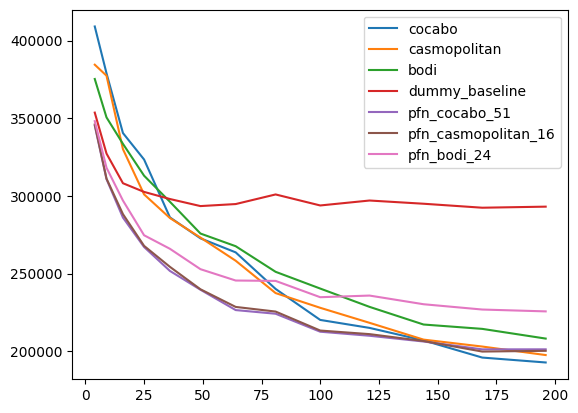

michalewicz


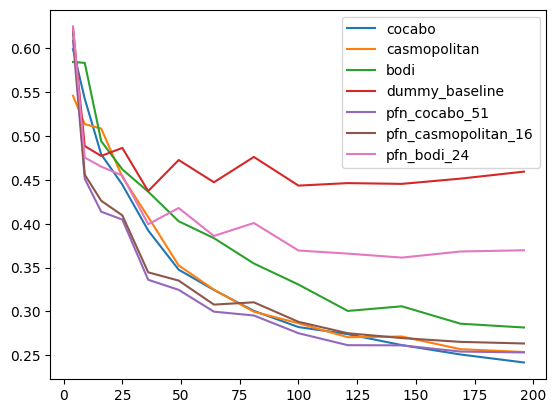

griewank


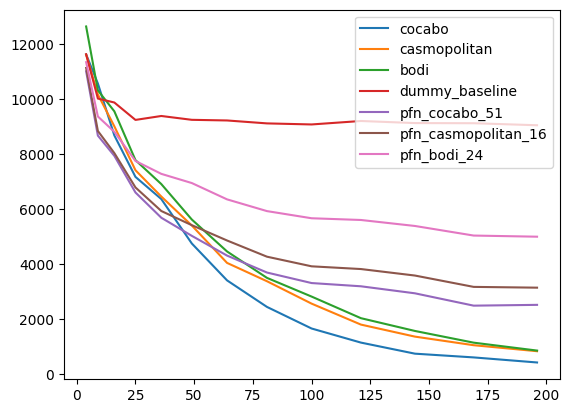

rosenbrock


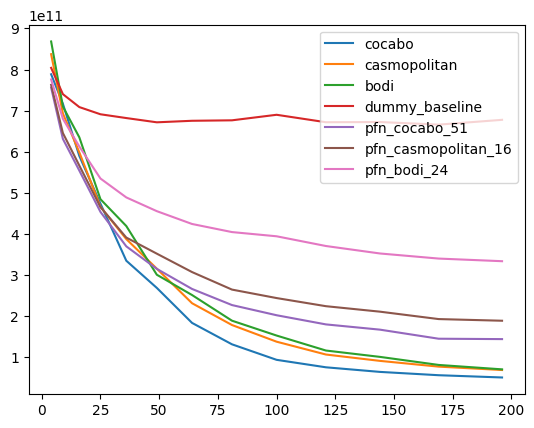

levy


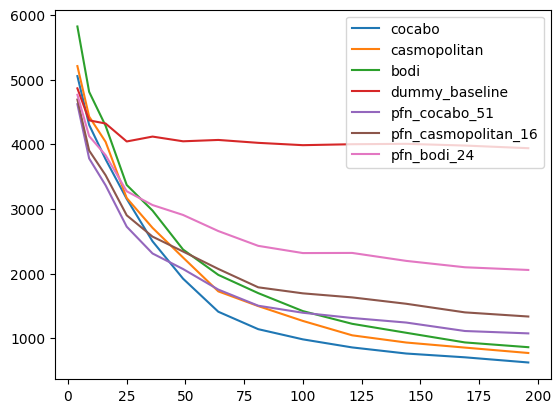

In [286]:


#optimizer_list = ['pfn_bodi_24']
#optimizer_list = ['cocabo', 'pfn_cocabo_51']
#for task_name in ['xgboost_opt', 'schwefel', 'perm0', 'power_sum', 'michalewicz']:
for task_name in ['schwefel', 'michalewicz', 'griewank', 'rosenbrock', 'levy']:
    print(task_name)
    for optimizer_name in optimizer_list:
        for local in ['local_regression_']:
            try:
                df = pd.read_csv(f'{local}experiment_results/regression_{task_name}_{optimizer_name}.csv')
                df['n_dims'] = df['num_dims'] + df['cat_dims']
                #print(df)
                df = df.groupby('n_training_data')['mse_raw'].mean()
                plt.plot(df, label=optimizer_name)
            except:
                print(optimizer_name, task_name)
    
        
        #plt.plot(df['nth_guess'], df['time'], label=optimizer_name)
    plt.legend()
    plt.show()

schwefel
(1300, 6)


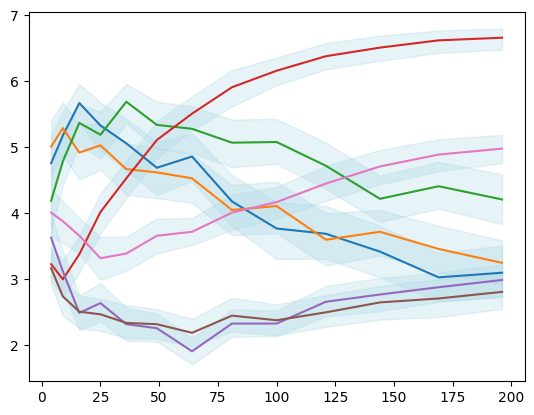

michalewicz
(1300, 6)


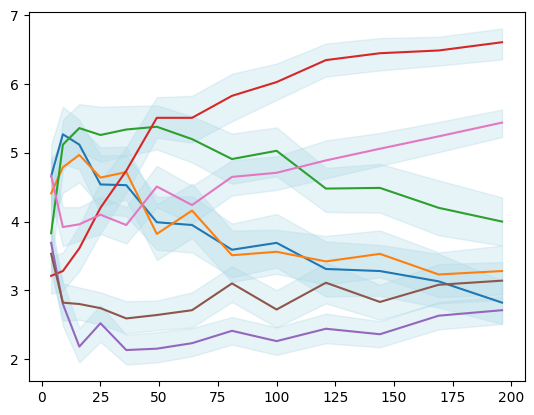

griewank
(1300, 6)


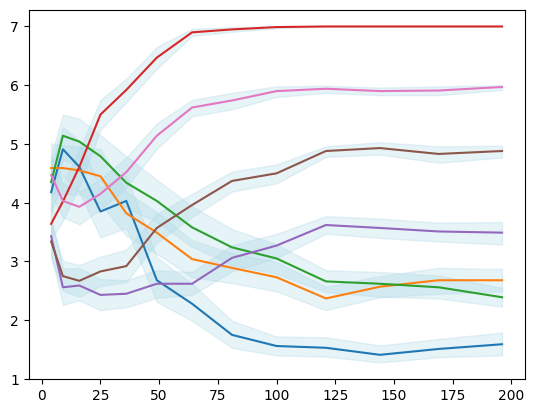

rosenbrock
(1300, 6)


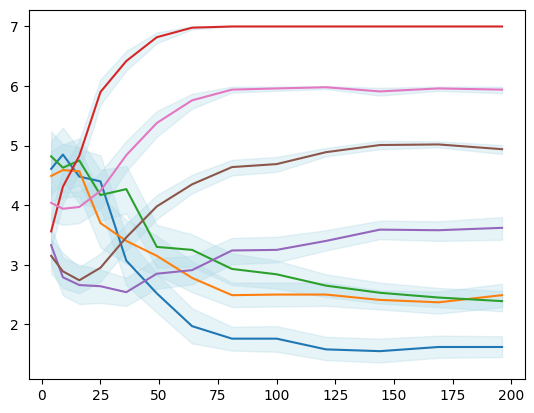

levy
(1300, 6)


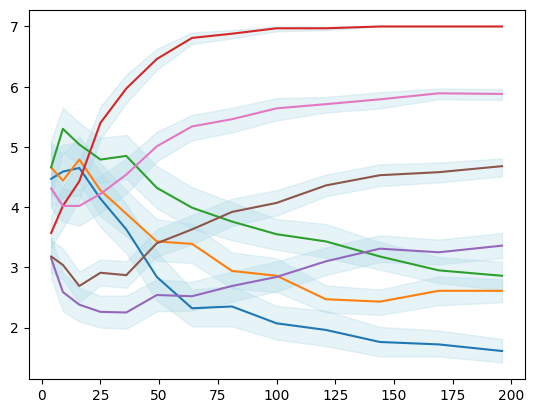

n_training_data


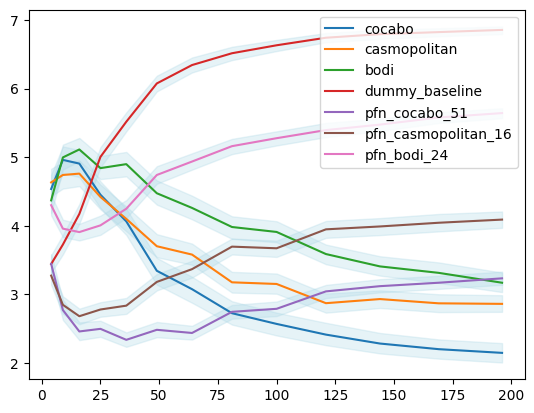

In [282]:
loss = 'nll_raw'
optimizer_list = ['cocabo', 'casmopolitan', 'bodi', 'dummy_baseline',
                  'pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24']
task_list = ['schwefel', 'michalewicz', 'griewank', 'rosenbrock', 'levy']
df = pd.read_csv(f'local_regression_experiment_results/regression_schwefel_cocabo.csv')
df = pd.DataFrame(columns = df.columns)
for optimizer_name in optimizer_list:
    for task_name in task_list:
        mini_df = pd.read_csv(f'local_regression_experiment_results/regression_{task_name}_{optimizer_name}.csv')
        mini_df['model_name'] = optimizer_name

        #print(mini_df['model_name'].unique(), mini_df['task_name'].unique(), mini_df['setup_number'].unique())
        df = pd.concat([df, mini_df], ignore_index=True)


index_columns = ['task_name','setup_number','n_training_data']
df = df.reset_index()
df['n_dims'] = df['num_dims'] + df['cat_dims']
df = df.pivot(columns='model_name', index=index_columns, values=loss)
df = df.reset_index()
df[optimizer_list] = df[optimizer_list].rank(axis=1)
df = pd.melt(df, id_vars=index_columns)
df['rank'] = df['value']

rank_df = pd.DataFrame(columns=['optimizer_name', 'task_name', 'n_training_data', 'mean_rank','lb','ub'])
for task_name in task_list:
    print(task_name)
    for optimizer_name in optimizer_list:
        mini_df = df[(df['model_name']==optimizer_name) * (df['task_name']==task_name)]
        if optimizer_name=='dummy_baseline':
            print(mini_df.shape)
        mean_rank = mini_df.groupby('n_training_data')['rank'].mean()
        plt.plot(mean_rank, label=optimizer_name)
    
        x = np.array(mini_df['n_training_data'].unique()).astype(float)
        ub = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_ub)
        lb = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_lb)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)
    
        rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer_name': optimizer_name, 
            'task_name':task_name,
            'n_training_data': x, 
            'mean_rank': mean_rank,
            'lb':lb,
            'ub':ub
        })])
    plt.show()

#rank_df.to_csv('data_for_thesis_figures/regression_rank_individual_tasks.csv')

print('n_training_data')
#rank_df = pd.DataFrame(columns=['optimizer_name', 'task_name', 'n_training_data', 'mean_rank','lb','ub'])
#print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer_name', 'n_training_data', 'mean_rank','lb','ub'])
for optimizer_name in optimizer_list:
    mini_df = df[(df['model_name']==optimizer_name)]
    mean_rank = mini_df.groupby('n_training_data')['rank'].mean()
    plt.plot(mean_rank, label=optimizer_name)

    x = np.array(mini_df['n_training_data'].unique()).astype(float)
    ub = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_ub)
    lb = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    rank_df = pd.concat([rank_df,pd.DataFrame({
        'optimizer_name': optimizer_name, 
        'task_name': 'All Tasks',
        'n_training_data': x, 
        'mean_rank': mean_rank,
        'lb':lb,
        'ub':ub
    })])
rank_df.to_csv('data_for_thesis_figures/regression_rank_all_tasks.csv')
plt.legend()
plt.show()

# Overlap Plots

In [100]:
for filename in ['evaluation_data/divergence_results_51.csv',
                 'casmo_evaluation_data/divergence_results_16.csv',
                 'bodi_evaluation_data/divergence_results_24.csv']:
    df = pd.read_csv(filename)
    print(df['overlap'].mean())

0.7869066781754309
0.8122860709299083
0.7707774344715276


In [296]:
optimizer_list = ['pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24', 
                  'CoCaBO_dummy_baseline', 'Casmopolitan_dummy_baseline', 'BODi_dummy_baseline']
task_list = ['schwefel', 'michalewicz', 'griewank', 'rosenbrock', 'levy']
df = pd.read_csv(f'local_overlap_experiment_results/overlap_schwefel_{optimizer_name}.csv')
df = pd.DataFrame(columns=df.columns)
overlap_df = pd.DataFrame(columns=['model_name', 'overlap_mean', 'lb', 'ub'])
for optimizer_name in optimizer_list:
    opt_df = pd.DataFrame(columns=df.columns)
    for task_name in task_list:
        opt_df = pd.concat([opt_df, pd.read_csv(f'local_overlap_experiment_results/overlap_{task_name}_{optimizer_name}.csv')])
    #print(optimizer_name, opt_df['overlap'].mean())
    overlap_df = pd.concat([overlap_df, pd.DataFrame({
        'model_name': [optimizer_name],
        'overlap_mean': opt_df['overlap'].mean(),
        'lb': bootstrap_lb(opt_df['overlap']),
        'ub': bootstrap_ub(opt_df['overlap'])
    })])

overlap_df = overlap_df.reset_index()
overlap_df.to_csv('data_for_thesis_figures/overlap_scores_per_model.csv')

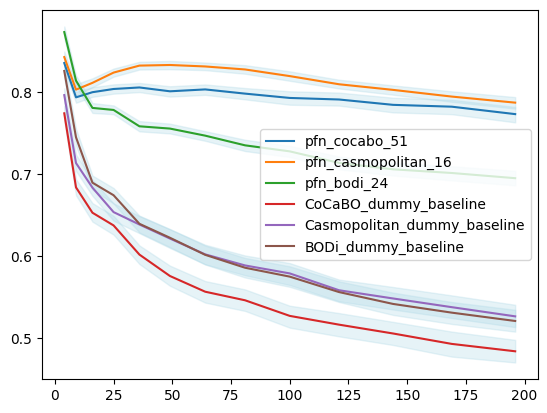

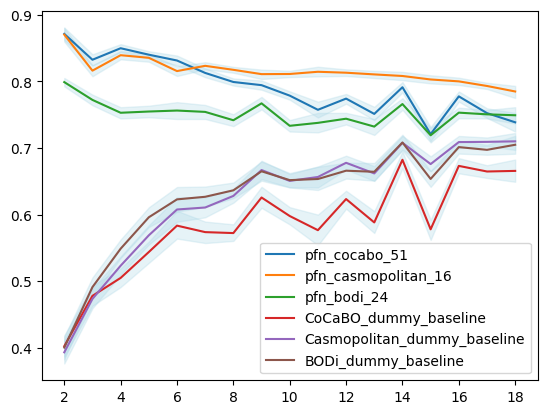

In [280]:
optimizer_list = ['pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24', 
                  'CoCaBO_dummy_baseline', 'Casmopolitan_dummy_baseline', 'BODi_dummy_baseline']
task_list = ['schwefel', 'michalewicz', 'griewank', 'rosenbrock', 'levy']
x_axis = 'n_training_data'
#optimizer_list = ['pfn_bodi_24']
#optimizer_list = ['cocabo', 'pfn_cocabo_51']
#for task_name in ['xgboost_opt', 'schwefel', 'perm0', 'power_sum', 'michalewicz']:

overlap_df = pd.DataFrame(columns=['optimizer', 'x_type', 'x_val', 'mean_overlap','lb','ub'])

for optimizer_name in optimizer_list:
    df = pd.read_csv(f'local_overlap_experiment_results/overlap_schwefel_{optimizer_name}.csv')
    df = pd.DataFrame(columns=df.columns)
    
    for task_name in task_list:
        df = pd.concat([df, pd.read_csv(f'local_overlap_experiment_results/overlap_{task_name}_{optimizer_name}.csv')])
        
    df['n_dims'] = df['num_dims'] + df['cat_dims']
    df['pfn_time'] = df['pfn_fit_time'] + df['pfn_predict_time']
    mean = df.groupby(x_axis)['overlap'].mean()
    x = mean.index.get_level_values(x_axis)
    plt.plot(x, mean, label=optimizer_name)

    ub = df.groupby(x_axis)['overlap'].apply(bootstrap_ub)
    lb = df.groupby(x_axis)['overlap'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    overlap_df = pd.concat([overlap_df,pd.DataFrame({
            'optimizer': optimizer_name, 
            'x_type': 'Number of Training Data',
            'x_val': x, 
            'mean_overlap': mean,
            'lb':lb,
            'ub':ub
        })])
        
plt.legend()
plt.show()

x_axis = 'n_dims'
#optimizer_list = ['pfn_bodi_24']
#optimizer_list = ['cocabo', 'pfn_cocabo_51']
#for task_name in ['xgboost_opt', 'schwefel', 'perm0', 'power_sum', 'michalewicz']:

for optimizer_name in optimizer_list:
    df = pd.read_csv(f'local_overlap_experiment_results/overlap_schwefel_{optimizer_name}.csv')
    df = pd.DataFrame(columns=df.columns)
    
    for task_name in task_list:
        df = pd.concat([df, pd.read_csv(f'local_overlap_experiment_results/overlap_{task_name}_{optimizer_name}.csv')])
        
    df['n_dims'] = df['num_dims'] + df['cat_dims']
    df['pfn_time'] = df['pfn_fit_time'] + df['pfn_predict_time']
    mean = df.groupby(x_axis)['overlap'].mean()
    x = mean.index.get_level_values(x_axis)
    plt.plot(x, mean, label=optimizer_name)

    ub = df.groupby(x_axis)['overlap'].apply(bootstrap_ub)
    lb = df.groupby(x_axis)['overlap'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)
        
    overlap_df = pd.concat([overlap_df,pd.DataFrame({
            'optimizer': optimizer_name, 
            'x_type': 'Number of Dimensions',
            'x_val': x, 
            'mean_overlap': mean,
            'lb':lb,
            'ub':ub
        })])
overlap_df.to_csv('data_for_thesis_figures/overlap_plots.csv')

plt.legend()
plt.show()

# Mixed PFNs

### Regression

schwefel
michalewicz
griewank
rosenbrock
levy


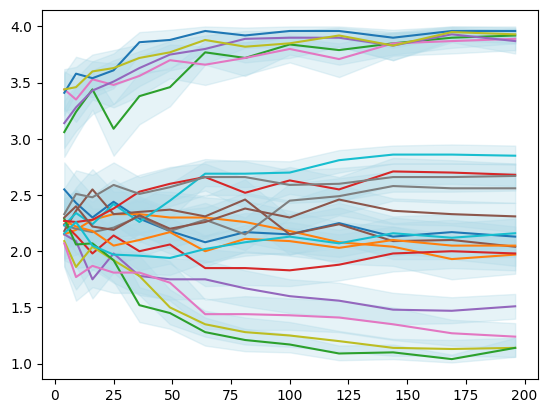

all tasks


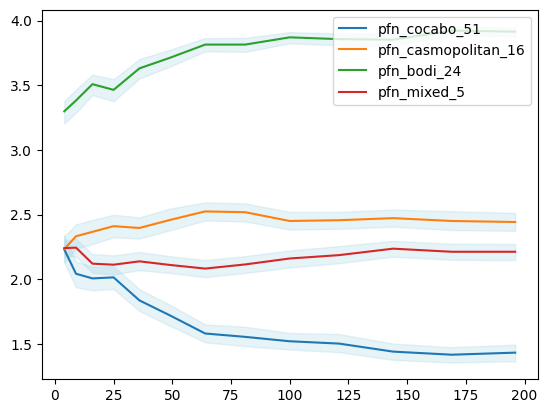

schwefel
michalewicz
griewank
rosenbrock
levy


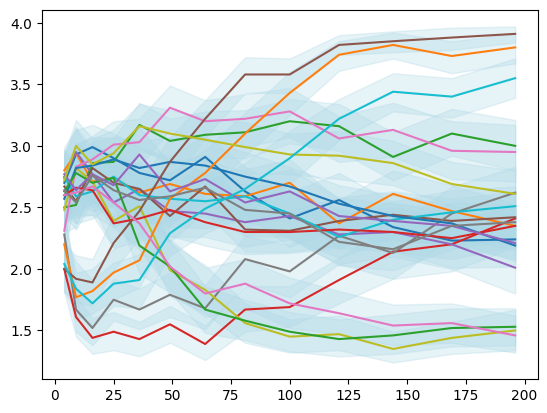

all tasks


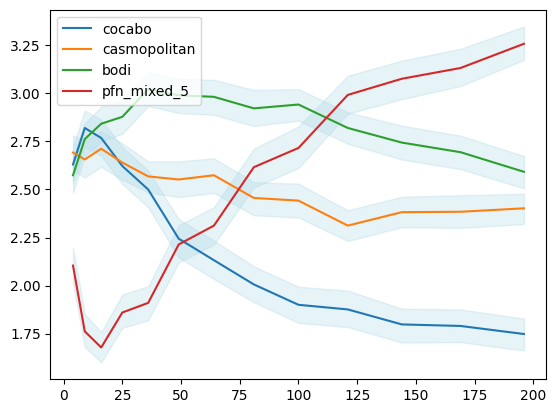

In [396]:
loss = 'nll_raw'
optimizer_list = ['cocabo', 'casmopolitan', 'bodi', 'dummy_baseline',
                  'pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24']
optimizer_list = ['pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24', 'pfn_mixed_5']
task_list = ['schwefel', 'michalewicz', 'griewank', 'rosenbrock', 'levy']
df = pd.read_csv(f'local_regression_experiment_results/regression_schwefel_cocabo.csv')
df = pd.DataFrame(columns = df.columns)
for optimizer_name in optimizer_list:
    for task_name in task_list:
        mini_df = pd.read_csv(f'local_regression_experiment_results/regression_{task_name}_{optimizer_name}.csv')
        mini_df['model_name'] = optimizer_name

        #print(mini_df['model_name'].unique(), mini_df['task_name'].unique(), mini_df['setup_number'].unique())
        df = pd.concat([df, mini_df], ignore_index=True)


index_columns = ['task_name','setup_number','n_training_data']
df = df.reset_index()
df['n_dims'] = df['num_dims'] + df['cat_dims']
df = df.pivot(columns='model_name', index=index_columns, values=loss)
df = df.reset_index()
df[optimizer_list] = df[optimizer_list].rank(axis=1)
df = pd.melt(df, id_vars=index_columns)
df['rank'] = df['value']

rank_df = pd.DataFrame(columns=['optimizer_name', 'comparison', 'task_name', 'n_training_data', 'mean_rank','lb','ub'])
for task_name in task_list:
    print(task_name)
    for optimizer_name in optimizer_list:
        mini_df = df[(df['model_name']==optimizer_name) * (df['task_name']==task_name)]
        if optimizer_name=='dummy_baseline':
            print(mini_df.shape)
        mean_rank = mini_df.groupby('n_training_data')['rank'].mean()
        plt.plot(mean_rank, label=optimizer_name)
    
        x = np.array(mini_df['n_training_data'].unique()).astype(float)
        ub = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_ub)
        lb = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_lb)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)
    
        '''rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer_name': opt_to_formal_name[optimizer_name], 
            'task_name':task_name,
            'n_training_data': x, 
            'mean_rank': mean_rank,
            'lb':lb,
            'ub':ub
        })])'''
plt.show()

#rank_df.to_csv('data_for_thesis_figures/regression_rank_individual_tasks.csv')

print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer_name', 'task_name', 'n_training_data', 'mean_rank','lb','ub'])
#print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer_name', 'n_training_data', 'mean_rank','lb','ub'])
for optimizer_name in optimizer_list:
    mini_df = df[(df['model_name']==optimizer_name)]
    mean_rank = mini_df.groupby('n_training_data')['rank'].mean()
    plt.plot(mean_rank, label=optimizer_name)

    x = np.array(mini_df['n_training_data'].unique()).astype(float)
    ub = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_ub)
    lb = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    rank_df = pd.concat([rank_df,pd.DataFrame({
        'optimizer_name': opt_to_formal_name[optimizer_name], 
        'comparison': 'vs. Other PFNs',
        'task_name': 'All Tasks',
        'n_training_data': x, 
        'mean_rank': mean_rank,
        'lb':lb,
        'ub':ub
    })])
rank_df.to_csv('data_for_thesis_figures/regression_mixed_pfn_ranks.csv')
plt.legend()
plt.show()


loss = 'nll_raw'
optimizer_list = ['cocabo', 'casmopolitan', 'bodi', 'dummy_baseline',
                  'pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24']
optimizer_list = ['cocabo', 'casmopolitan', 'bodi', 'pfn_mixed_5']
task_list = ['schwefel', 'michalewicz', 'griewank', 'rosenbrock', 'levy']
df = pd.read_csv(f'local_regression_experiment_results/regression_schwefel_cocabo.csv')
df = pd.DataFrame(columns = df.columns)
for optimizer_name in optimizer_list:
    for task_name in task_list:
        mini_df = pd.read_csv(f'local_regression_experiment_results/regression_{task_name}_{optimizer_name}.csv')
        mini_df['model_name'] = optimizer_name

        #print(mini_df['model_name'].unique(), mini_df['task_name'].unique(), mini_df['setup_number'].unique())
        df = pd.concat([df, mini_df], ignore_index=True)


index_columns = ['task_name','setup_number','n_training_data']
df = df.reset_index()
df['n_dims'] = df['num_dims'] + df['cat_dims']
df = df.pivot(columns='model_name', index=index_columns, values=loss)
df = df.reset_index()
df[optimizer_list] = df[optimizer_list].rank(axis=1)
df = pd.melt(df, id_vars=index_columns)
df['rank'] = df['value']

#rank_df = pd.DataFrame(columns=['optimizer_name', 'task_name', 'n_training_data', 'mean_rank','lb','ub'])
for task_name in task_list:
    print(task_name)
    for optimizer_name in optimizer_list:
        mini_df = df[(df['model_name']==optimizer_name) * (df['task_name']==task_name)]
        if optimizer_name=='dummy_baseline':
            print(mini_df.shape)
        mean_rank = mini_df.groupby('n_training_data')['rank'].mean()
        plt.plot(mean_rank, label=optimizer_name)
    
        x = np.array(mini_df['n_training_data'].unique()).astype(float)
        ub = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_ub)
        lb = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_lb)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)
    
        '''rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer_name': opt_to_formal_name[optimizer_name], 
            'task_name':task_name,
            'n_training_data': x, 
            'mean_rank': mean_rank,
            'lb':lb,
            'ub':ub
        })])'''
plt.show()

#rank_df.to_csv('data_for_thesis_figures/regression_rank_individual_tasks.csv')

print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer_name', 'task_name', 'n_training_data', 'mean_rank','lb','ub'])
#print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer_name', 'n_training_data', 'mean_rank','lb','ub'])
for optimizer_name in optimizer_list:
    mini_df = df[(df['model_name']==optimizer_name)]
    mean_rank = mini_df.groupby('n_training_data')['rank'].mean()
    plt.plot(mean_rank, label=optimizer_name)

    x = np.array(mini_df['n_training_data'].unique()).astype(float)
    ub = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_ub)
    lb = mini_df.groupby('n_training_data')['rank'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    rank_df = pd.concat([rank_df,pd.DataFrame({
        'optimizer_name': opt_to_formal_name[optimizer_name], 
        'comparison': 'vs. MCBO',
        'task_name': 'All Tasks',
        'n_training_data': x, 
        'mean_rank': mean_rank,
        'lb':lb,
        'ub':ub
    })])
rank_df.to_csv('data_for_thesis_figures/regression_mixed_mcbo_ranks.csv')
plt.legend()
plt.show()

### BO

['pfn_cocabo_51' 'pfn_casmopolitan_16' 'pfn_bodi_24' 'pfn_mixed_5']
(144720, 13)
(36180, 8)
(144720, 7)
griewank


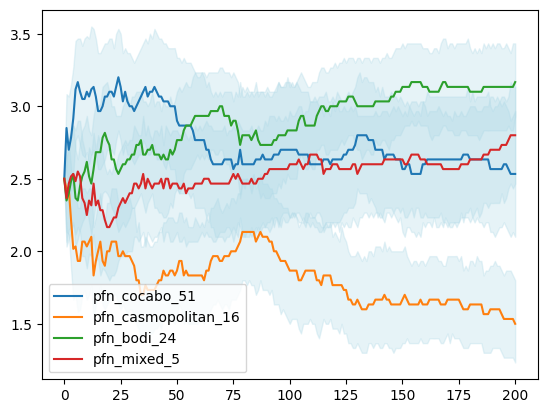

levy


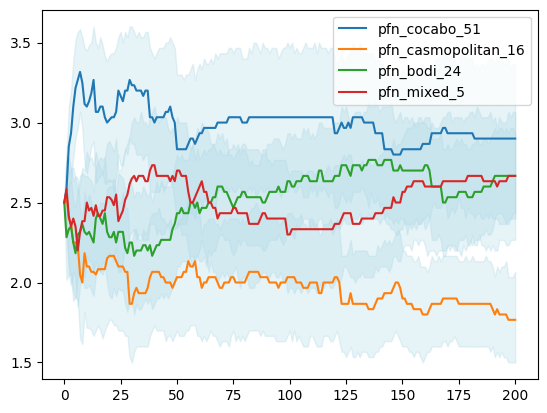

michalewicz


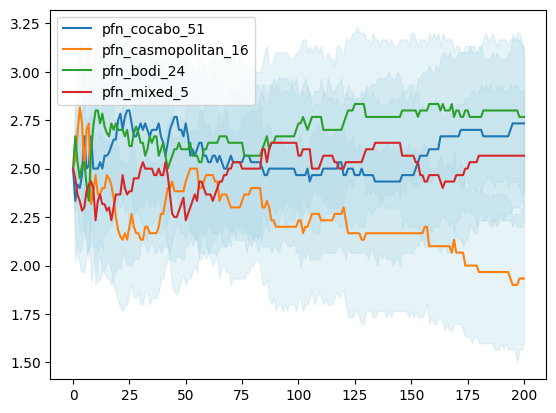

rosenbrock


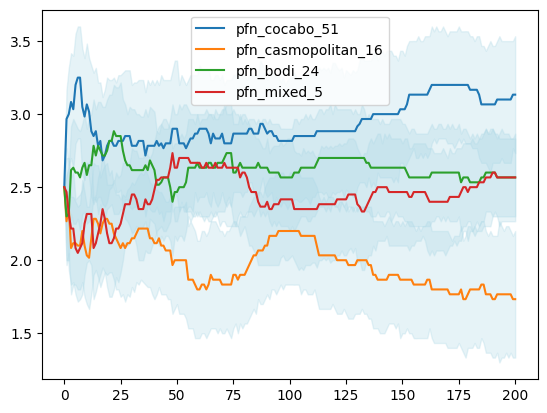

schwefel


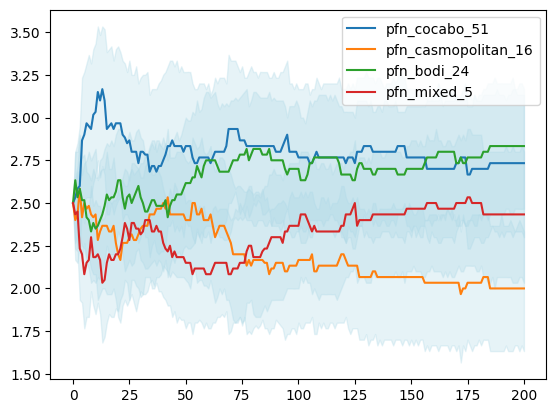

xgboost_opt


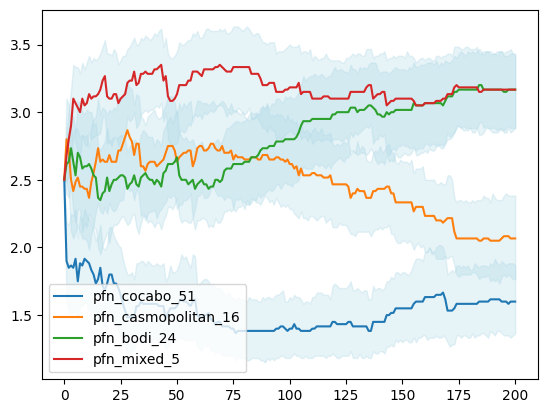

all tasks


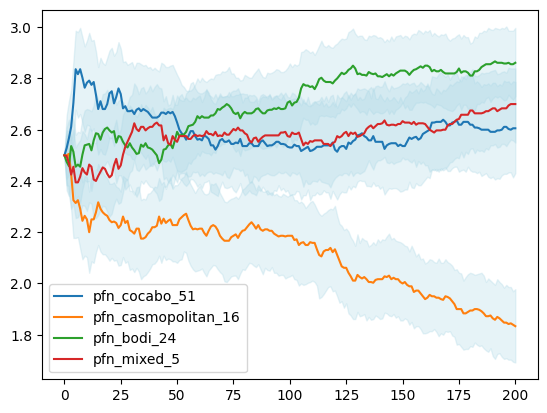

['cocabo' 'casmopolitan' 'bodi' 'pfn_mixed_5']
(144720, 13)
(36180, 8)
(144720, 7)
xgboost_opt


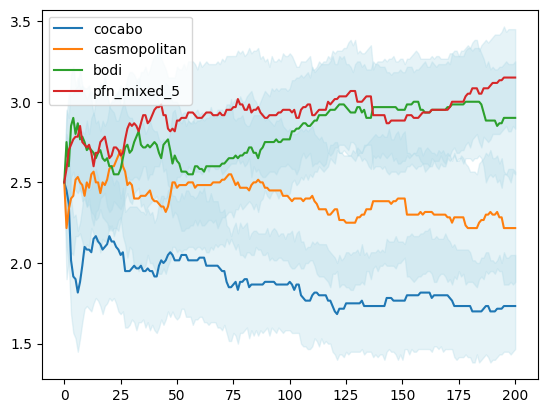

schwefel


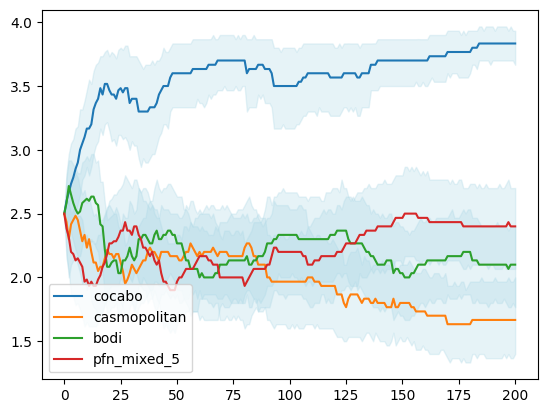

michalewicz


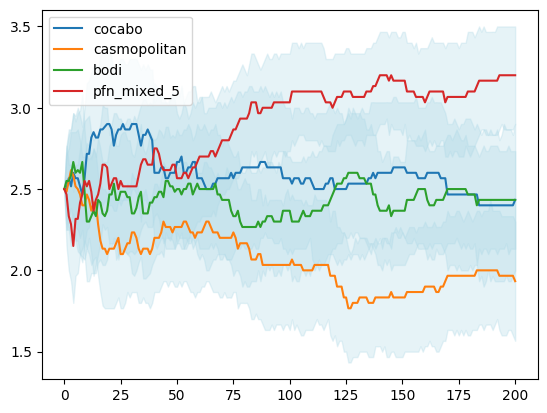

griewank


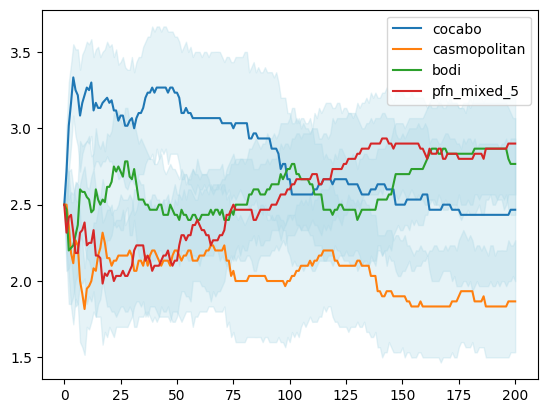

rosenbrock


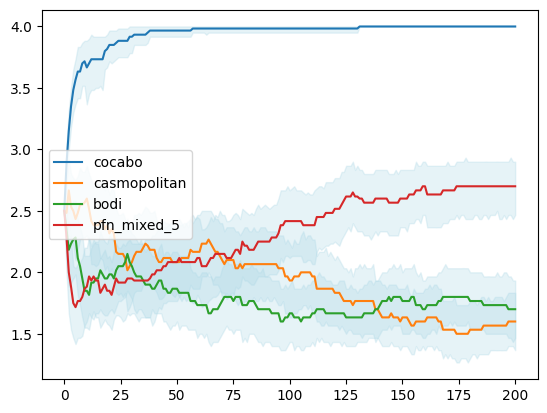

levy


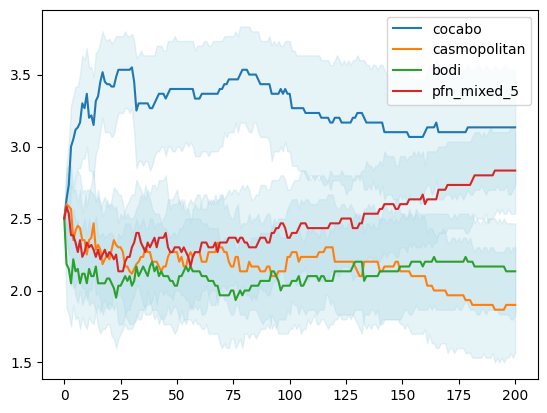

all tasks


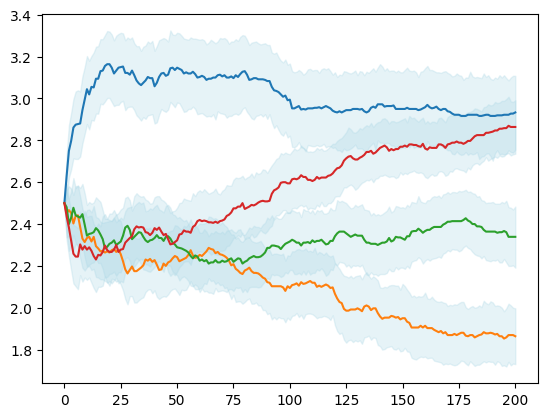

(289440, 13)
(36180, 12)
(289440, 7)
xgboost_opt


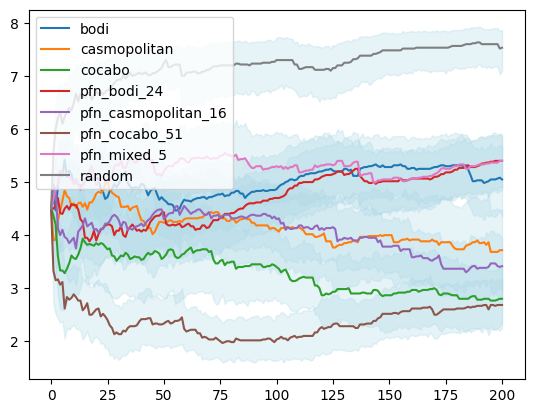

schwefel


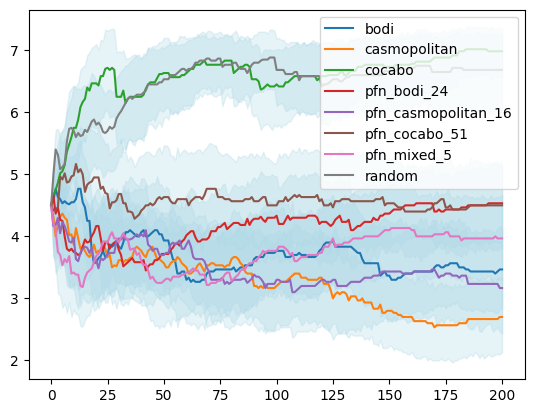

michalewicz


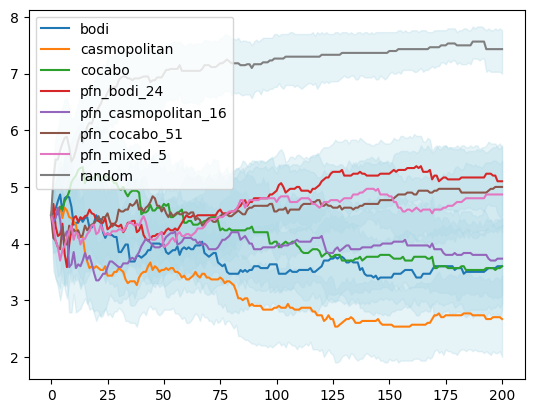

griewank


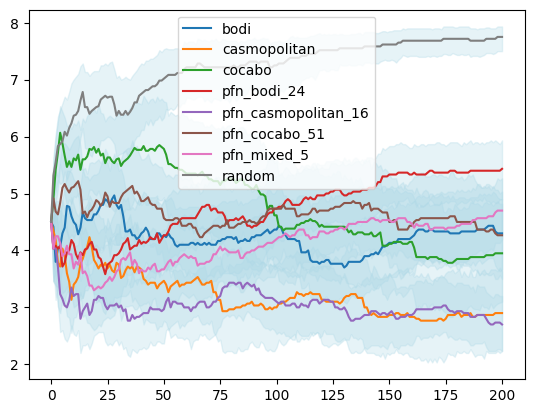

rosenbrock


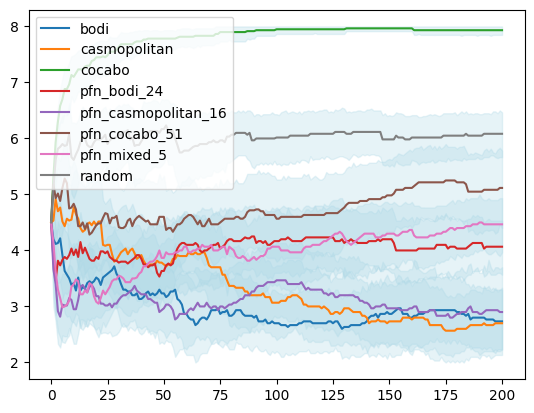

levy


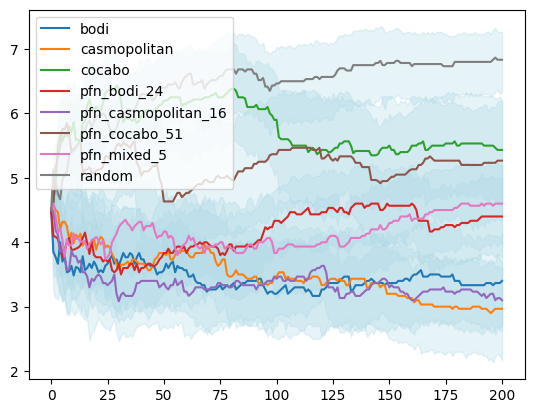

all tasks


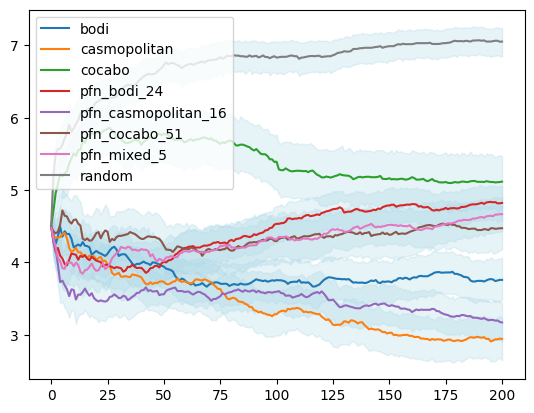

,optimizer,comparison,task,iteration,mean_rank,lb,ub
0,PFN-CoCaBO,vs. PFNs,griewank,0.0,2.500000,2.500000,2.500000
1,PFN-CoCaBO,vs. PFNs,griewank,1.0,2.850000,2.600000,3.083333
2,PFN-CoCaBO,vs. PFNs,griewank,2.0,2.700000,2.300000,3.066667
3,PFN-CoCaBO,vs. PFNs,griewank,3.0,2.783333,2.416250,3.150000
4,PFN-CoCaBO,vs. PFNs,griewank,4.0,2.916667,2.533333,3.266667
...,...,...,...,...,...,...,...
196,Random Baseline,vs. All,All Tasks,196.0,7.058333,6.855556,7.233333
197,Random Baseline,vs. All,All Tasks,197.0,7.063889,6.852708,7.241806
198,Random Baseline,vs. All,All Tasks,198.0,7.063889,6.866597,7.252778
199,Random Baseline,vs. All,All Tasks,199.0,7.050000,6.852708,7.233403


In [46]:


df = get_big_df()
df = df[df['optimizer_name'].str.contains('pfn')]
print(df['optimizer_name'].unique())
optimizers = df['optimizer_name'].unique()
print(df.shape)
df = df.pivot(columns='optimizer_name', index=['task_name','seed','setup_number','nth_guess'], values='best_y')
df = df.reset_index()
print(df.shape)
df[optimizers] = df[optimizers].rank(axis=1)
df = df.melt(['task_name','seed','setup_number','nth_guess'])
df['rank'] = df['value']
print(df.shape)

rank_df = pd.DataFrame(columns=['optimizer', 'comparison', 'task', 'iteration', 'mean_rank','lb','ub'])

for task_name in df['task_name'].unique():
    for optimizer_name in optimizers:
        mini_df = df[(df['task_name']==task_name) * (df['optimizer_name']==optimizer_name)]
        mean_rank = mini_df.groupby('nth_guess')['rank'].mean()
        plt.plot(mean_rank, label=optimizer_name)
        
        x = np.array(mini_df['nth_guess'].unique()).astype(float)
        ub = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
        lb = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

        rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer': opt_to_formal_name[optimizer_name], 
            'comparison': 'vs. PFNs',
            'task': task_name,
            'iteration': x, 
            'mean_rank': mean_rank,
            'lb':lb,
            'ub':ub
        })])
        
    print(task_name)
    plt.legend()
    plt.show()
# rank_df.to_csv('data_for_thesis_figures/BO_ranking_specific_tasks.csv')

print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer', 'iteration', 'mean_rank','lb','ub'])
for optimizer_name in optimizers:
    mini_df = df[(df['optimizer_name']==optimizer_name)]
    mean_rank = mini_df.groupby('nth_guess')['rank'].mean()
    plt.plot(mean_rank, label=optimizer_name)

    x = np.array(mini_df['nth_guess'].unique()).astype(float)
    ub = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
    lb = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    rank_df = pd.concat([rank_df,pd.DataFrame({
        'optimizer': opt_to_formal_name[optimizer_name], 
        'comparison': 'vs. PFNs',
        'task': 'All Tasks',
        'iteration': x, 
        'mean_rank': mean_rank,
        'lb':lb,
        'ub':ub
    })])

#if save_csvs:
    #rank_df.to_csv('data_for_thesis_figures/BO_ranking_all_tasks.csv')
plt.legend()
plt.show()



df = get_big_df()
df = df[df['optimizer_name'] != 'random']
df = df[df['optimizer_name'] != 'pfn_cocabo_51']
df = df[df['optimizer_name'] != 'pfn_bodi_24']
df = df[df['optimizer_name'] != 'pfn_casmopolitan_16']
optimizers = df['optimizer_name'].unique()
print(df['optimizer_name'].unique())
print(df.shape)
df = df.pivot(columns='optimizer_name', index=['task_name','seed','setup_number','nth_guess'], values='best_y')
df = df.reset_index()
print(df.shape)
df[optimizers] = df[optimizers].rank(axis=1)
df = df.melt(['task_name','seed','setup_number','nth_guess'])
df['rank'] = df['value']
print(df.shape)



for task_name in task_list:
    for optimizer_name in optimizers:
        mini_df = df[(df['task_name']==task_name) * (df['optimizer_name']==optimizer_name)]
        mean_rank = mini_df.groupby('nth_guess')['rank'].mean()
        plt.plot(mean_rank, label=optimizer_name)
        
        x = np.array(mini_df['nth_guess'].unique()).astype(float)
        ub = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
        lb = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

        rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer': opt_to_formal_name[optimizer_name], 
            'comparison': 'vs. GP-Based Methods',
            'task': task_name,
            'iteration': x, 
            'mean_rank': mean_rank,
            'lb':lb,
            'ub':ub
        })])
        
    print(task_name)
    plt.legend()
    plt.show()
# rank_df.to_csv('data_for_thesis_figures/BO_ranking_specific_tasks.csv')

print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer', 'iteration', 'mean_rank','lb','ub'])
for optimizer_name in optimizers:
    mini_df = df[(df['optimizer_name']==optimizer_name)]
    mean_rank = mini_df.groupby('nth_guess')['rank'].mean()
    plt.plot(mean_rank, label=optimizer_name)

    x = np.array(mini_df['nth_guess'].unique()).astype(float)
    ub = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
    lb = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    rank_df = pd.concat([rank_df,pd.DataFrame({
        'optimizer': opt_to_formal_name[optimizer_name], 
        'comparison': 'vs. GP-Based Methods',
        'task': 'All Tasks',
        'iteration': x, 
        'mean_rank': mean_rank,
        'lb':lb,
        'ub':ub
    })])
plt.show()

'''df = pd.read_csv(f'experiment_results/BO_schwefel_random.csv')
df = pd.DataFrame(columns = df.columns)
optimizer_list = ['random', 'cocabo', 'casmopolitan', 'bodi', 
                  'pfn_cocabo_51', 'pfn_casmopolitan_16', 'pfn_bodi_24', 'pfn_mixed_5']
for optimizer_name in optimizer_list:
    for task_name in task_list:
        for seed in seed_list:
            mini_df = pd.read_csv(f'experiment_results/BO_{task_name}_{optimizer_name}{seed}.csv')
            mini_df.dropna(inplace=True)
            int_cols = ['nth_guess', 'setup_number', 'num_dims', 'cat_dims', 'seed']
            mini_df[int_cols] = mini_df[int_cols].astype(int)
            assert mini_df.shape[0] == 3000
            #print(mini_df.shape, mini_df['setup_number'].unique())
            mini_df['optimizer_name'] = optimizer_name
            df = pd.concat([df, mini_df], ignore_index=True)'''
df = get_big_df()
optimizers = df['optimizer_name'].unique()
print(df.shape)
df = df.pivot(columns='optimizer_name', index=['task_name','seed','setup_number','nth_guess'], values='best_y')
df = df.reset_index()
print(df.shape)
df[optimizers] = df[optimizers].rank(axis=1)
df = df.melt(['task_name','seed','setup_number','nth_guess'])
df['rank'] = df['value']
print(df.shape)



for task_name in task_list:
    for optimizer_name in df['optimizer_name'].unique():
        mini_df = df[(df['task_name']==task_name) * (df['optimizer_name']==optimizer_name)]
        mean_rank = mini_df.groupby('nth_guess')['rank'].mean()
        plt.plot(mean_rank, label=optimizer_name)
        
        x = np.array(mini_df['nth_guess'].unique()).astype(float)
        ub = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
        lb = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
        plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

        rank_df = pd.concat([rank_df,pd.DataFrame({
            'optimizer': opt_to_formal_name[optimizer_name], 
            'comparison': 'vs. All',
            'task': task_name,
            'iteration': x, 
            'mean_rank': mean_rank,
            'lb':lb,
            'ub':ub
        })])
        
    print(task_name)
    plt.legend()
    plt.show()
# rank_df.to_csv('data_for_thesis_figures/BO_ranking_specific_tasks.csv')

print('all tasks')
#rank_df = pd.DataFrame(columns=['optimizer', 'iteration', 'mean_rank','lb','ub'])
for optimizer_name in df['optimizer_name'].unique():
    mini_df = df[(df['optimizer_name']==optimizer_name)]
    mean_rank = mini_df.groupby('nth_guess')['rank'].mean()
    plt.plot(mean_rank, label=optimizer_name)

    x = np.array(mini_df['nth_guess'].unique()).astype(float)
    ub = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_ub)
    lb = mini_df.groupby('nth_guess')['rank'].apply(bootstrap_lb)
    plt.fill_between(x, lb, ub, color='lightblue', alpha=0.3)

    rank_df = pd.concat([rank_df,pd.DataFrame({
        'optimizer': opt_to_formal_name[optimizer_name], 
        'comparison': 'vs. All',
        'task': 'All Tasks',
        'iteration': x, 
        'mean_rank': mean_rank,
        'lb':lb,
        'ub':ub
    })])



rank_df.to_csv('data_for_thesis_figures/mixed_BO_ranking.csv')
plt.legend()
plt.show()
rank_df